# Phase 3: Modeling and Error Analysis

Link for Phase 2 notebook where I have come up with below processed data

https://colab.research.google.com/drive/16kEUeoHlWnpVqc6wVGnVGPiwxCINqg6h?usp=sharing

Link for the processed dataset after Phase 2:
https://drive.google.com/file/d/1ex0VLZsoEn4XE3H3W0tt_9mIUNgHaUJj/view?usp=sharing

In [1]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegressionCV
import sklearn
from pycaret.classification import *      #importing all functions of classification module of pycaret.

# Loading Pocessed data

In [2]:
from google.colab import drive
drive.mount('/content/drive')

processed_data_path='/content/drive/MyDrive/AppliedRoots/Project/processed_data.csv'

processed_data=pd.read_csv(processed_data_path)

ModuleNotFoundError: No module named 'google.colab'

In [2]:
# for running in local
processed_data=pd.read_csv('processed_data.csv')

In [3]:
processed_data.head()

,Unnamed: 0,BeneID,ClaimID,ClaimStartDt,ClaimEndDt,Provider,InscClaimAmtReimbursed,AttendingPhysician,OperatingPhysician,OtherPhysician,AdmissionDt,ClmAdmitDiagnosisCode,DeductibleAmtPaid,DischargeDt,DiagnosisGroupCode,ClmDiagnosisCode_1,ClmDiagnosisCode_2,ClmDiagnosisCode_3,ClmDiagnosisCode_4,ClmDiagnosisCode_5,ClmDiagnosisCode_6,ClmDiagnosisCode_7,ClmDiagnosisCode_8,ClmDiagnosisCode_9,ClmDiagnosisCode_10,ClmProcedureCode_1,ClmProcedureCode_2,ClmProcedureCode_3,ClmProcedureCode_4,ClmProcedureCode_5,ClmProcedureCode_6,DOB,DOD,Gender,Race,RenalDiseaseIndicator,State,County,NoOfMonths_PartACov,NoOfMonths_PartBCov,ChronicCond_Alzheimer,ChronicCond_Heartfailure,ChronicCond_KidneyDisease,ChronicCond_Cancer,ChronicCond_ObstrPulmonary,ChronicCond_Depression,ChronicCond_Diabetes,ChronicCond_IschemicHeart,ChronicCond_Osteoporasis,ChronicCond_rheumatoidarthritis,ChronicCond_stroke,IPAnnualReimbursementAmt,IPAnnualDeductibleAmt,OPAnnualReimbursementAmt,OPAnnualDeductibleAmt,PotentialFraud,noDaysAdmit,noDaysClaim,age,inOut,whetherAlive,ClaimMinusAdmitDays,PatientRiskValue,TotalAnnualReimbursementAmt,TotalAnnualDeductibleAmt
0,0,BENE11001,CLM46614,2009-04-12,2009-04-18,PRV55912,26000,PHY390922,0,0,2009-04-12 00:00:00,7866,1068.0,2009-04-18 00:00:00,201,1970,4019,5853,7843,2768,71590,2724,19889,5849,0,0.0,0.0,0.0,0.0,0.0,0.0,1943-01-01,0,1,1,0,39,230,12,12,1,0,1,0,0,1,1,1,0,1,1,36000,3204,60,70,Yes,7.0,7,66.0,1.0,1.0,0.0,7,36060,3274
1,1,BENE16973,CLM565430,2009-09-06,2009-09-06,PRV55912,50,PHY365867,PHY327147,0,0,0,0.0,0,0,V7183,53081,78959,4280,E8788,78079,79902,25002,71848,0,0.0,0.0,0.0,0.0,0.0,0.0,1932-05-01,0,1,1,0,39,310,12,12,1,1,1,0,0,0,0,1,0,0,0,24000,2136,450,200,Yes,0.0,1,77.0,0.0,1.0,1.0,4,24450,2336
2,2,BENE17521,CLM34721,2009-01-20,2009-02-01,PRV55912,19000,PHY349293,PHY370861,PHY363291,2009-01-20 00:00:00,45340,1068.0,2009-02-01 00:00:00,987,4240,2639,2948,40390,45821,28489,5854,2753,E9305,0,7769.0,5849.0,0.0,0.0,0.0,0.0,1913-12-01,0,0,1,0,39,230,12,12,1,1,1,0,1,0,0,1,0,0,0,19000,1068,100,20,Yes,13.0,13,95.0,1.0,1.0,0.0,5,19100,1088
3,3,BENE21718,CLM72336,2009-10-17,2009-11-04,PRV55912,17000,PHY334706,PHY334706,0,2009-10-17 00:00:00,V5789,1068.0,2009-11-04 00:00:00,941,V5789,4168,73313,7812,7993,78830,72273,43812,4019,0,9338.0,0.0,0.0,0.0,0.0,0.0,1922-10-01,0,1,1,0,39,600,12,12,0,0,0,0,0,0,0,1,1,0,0,17000,1068,1050,540,Yes,19.0,19,87.0,1.0,1.0,0.0,2,18050,1608
4,4,BENE22934,CLM73394,2009-10-25,2009-10-29,PRV55912,13000,PHY390614,PHY323689,PHY363291,2009-10-25 00:00:00,71946,1068.0,2009-10-29 00:00:00,506,71535,71960,4019,V1202,4240,2449,2768,0,0,0,8154.0,0.0,0.0,0.0,0.0,0.0,1930-07-01,0,0,1,0,39,280,12,12,0,1,0,0,1,0,1,1,1,1,0,27000,2136,450,160,Yes,5.0,5,79.0,1.0,1.0,0.0,6,27450,2296




*   Now we will do feature engineering on the dataset. Since , our test data don't have labels. We will split the above data into train & test and use those datasets for training and validations.
*   Before we do feature engineering , we will split data into train and test. Whatever transformations we will do , first we will apply in train set.Then we will concatenate train+test and apply same transformations on that and later will separate test data for validation.



*   The above process is followed sothat train set transformed independently, no information from test set is present and there is no data leakage. Also , we are concatenating train+test to transform tets set , sothat information derived from train set is utilised to transform test set also.









# Data Splitting and Featurisation separately on train and test data

In [4]:
processed_data.PotentialFraud.replace(['Yes','No'],[1,0],inplace=True)   #replacing 'Yes' and 'No' in target column with 1 and 0
processed_data.PotentialFraud=processed_data.PotentialFraud.astype('int64')

Splitting into test and train

In [5]:
x=processed_data.drop(axis=1,columns=['Unnamed: 0'])
y=processed_data['PotentialFraud']            #copying target column to 'y'

In [6]:
X_train, X_test_copy, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=30,stratify=y)
#X_train, X_test_copy = train_test_split(x ,test_size=0.20, random_state=30)

Concatenating train and test for transforming features of test dataset but we will use only test data for evaluation.

In [7]:
X_train_test=pd.concat([X_train,X_test_copy])
X_train.shape,X_test_copy.shape,X_train_test.shape                             #print shape of individual datasets.

((446568, 64), (111643, 64), (558211, 64))

Now we will do feature transformations on both X_train and X_train_test

Creating 15 new columns 'Mean_InscClaimAmtReimbursed_PerColumn' for physicians, beneficiary, claim diagnosis and procedure codes.

In [8]:
#On Train Data
X_train['Mean_InscClaimAmtReimbursed_PerAttendingPhysician']=X_train.groupby('AttendingPhysician')['InscClaimAmtReimbursed'].transform('mean')
X_train['Mean_InscClaimAmtReimbursed_PerOperatingPhysician']=X_train.groupby('OperatingPhysician')['InscClaimAmtReimbursed'].transform('mean')
X_train['Mean_InscClaimAmtReimbursed_PerOtherPhysician']=X_train.groupby('OtherPhysician')['InscClaimAmtReimbursed'].transform('mean')

X_train['Mean_InscClaimAmtReimbursed_PerClmAdmitDiagnosisCode']=X_train.groupby('ClmAdmitDiagnosisCode')['InscClaimAmtReimbursed'].transform('mean')
X_train['Mean_InscClaimAmtReimbursed_PerDiagnosisGroupCode']=X_train.groupby('DiagnosisGroupCode')['InscClaimAmtReimbursed'].transform('mean')
X_train['Mean_InscClaimAmtReimbursed_PerClmDiagnosisCode_1']=X_train.groupby('ClmDiagnosisCode_1')['InscClaimAmtReimbursed'].transform('mean')
X_train['Mean_InscClaimAmtReimbursed_PerClmDiagnosisCode_2']=X_train.groupby('ClmDiagnosisCode_2')['InscClaimAmtReimbursed'].transform('mean')
X_train['Mean_InscClaimAmtReimbursed_PerClmDiagnosisCode_3']=X_train.groupby('ClmDiagnosisCode_3')['InscClaimAmtReimbursed'].transform('mean')
X_train['Mean_InscClaimAmtReimbursed_PerClmDiagnosisCode_4']=X_train.groupby('ClmDiagnosisCode_4')['InscClaimAmtReimbursed'].transform('mean')
X_train['Mean_InscClaimAmtReimbursed_PerClmDiagnosisCode_5']=X_train.groupby('ClmDiagnosisCode_5')['InscClaimAmtReimbursed'].transform('mean')
X_train['Mean_InscClaimAmtReimbursed_PerClmDiagnosisCode_6']=X_train.groupby('ClmDiagnosisCode_6')['InscClaimAmtReimbursed'].transform('mean')

X_train['Mean_InscClaimAmtReimbursed_PerClmProcedureCode_1']=X_train.groupby('ClmProcedureCode_1')['InscClaimAmtReimbursed'].transform('mean')
X_train['Mean_InscClaimAmtReimbursed_PerClmProcedureCode_2']=X_train.groupby('ClmProcedureCode_2')['InscClaimAmtReimbursed'].transform('mean')
X_train['Mean_InscClaimAmtReimbursed_PerClmProcedureCode_3']=X_train.groupby('ClmProcedureCode_3')['InscClaimAmtReimbursed'].transform('mean')

X_train['Mean_InscClaimAmtReimbursedPerBeneID']=X_train.groupby('BeneID')['InscClaimAmtReimbursed'].transform('mean')



#On train + test concatenated data
X_train_test['Mean_InscClaimAmtReimbursed_PerAttendingPhysician']=X_train_test.groupby('AttendingPhysician')['InscClaimAmtReimbursed'].transform('mean')
X_train_test['Mean_InscClaimAmtReimbursed_PerOperatingPhysician']=X_train_test.groupby('OperatingPhysician')['InscClaimAmtReimbursed'].transform('mean')
X_train_test['Mean_InscClaimAmtReimbursed_PerOtherPhysician']=X_train_test.groupby('OtherPhysician')['InscClaimAmtReimbursed'].transform('mean')

X_train_test['Mean_InscClaimAmtReimbursed_PerClmAdmitDiagnosisCode']=X_train_test.groupby('ClmAdmitDiagnosisCode')['InscClaimAmtReimbursed'].transform('mean')
X_train_test['Mean_InscClaimAmtReimbursed_PerDiagnosisGroupCode']=X_train_test.groupby('DiagnosisGroupCode')['InscClaimAmtReimbursed'].transform('mean')
X_train_test['Mean_InscClaimAmtReimbursed_PerClmDiagnosisCode_1']=X_train_test.groupby('ClmDiagnosisCode_1')['InscClaimAmtReimbursed'].transform('mean')
X_train_test['Mean_InscClaimAmtReimbursed_PerClmDiagnosisCode_2']=X_train_test.groupby('ClmDiagnosisCode_2')['InscClaimAmtReimbursed'].transform('mean')
X_train_test['Mean_InscClaimAmtReimbursed_PerClmDiagnosisCode_3']=X_train_test.groupby('ClmDiagnosisCode_3')['InscClaimAmtReimbursed'].transform('mean')
X_train_test['Mean_InscClaimAmtReimbursed_PerClmDiagnosisCode_4']=X_train_test.groupby('ClmDiagnosisCode_4')['InscClaimAmtReimbursed'].transform('mean')
X_train_test['Mean_InscClaimAmtReimbursed_PerClmDiagnosisCode_5']=X_train_test.groupby('ClmDiagnosisCode_5')['InscClaimAmtReimbursed'].transform('mean')
X_train_test['Mean_InscClaimAmtReimbursed_PerClmDiagnosisCode_6']=X_train_test.groupby('ClmDiagnosisCode_6')['InscClaimAmtReimbursed'].transform('mean')

X_train_test['Mean_InscClaimAmtReimbursed_PerClmProcedureCode_1']=X_train_test.groupby('ClmProcedureCode_1')['InscClaimAmtReimbursed'].transform('mean')
X_train_test['Mean_InscClaimAmtReimbursed_PerClmProcedureCode_2']=X_train_test.groupby('ClmProcedureCode_2')['InscClaimAmtReimbursed'].transform('mean')
X_train_test['Mean_InscClaimAmtReimbursed_PerClmProcedureCode_3']=X_train_test.groupby('ClmProcedureCode_3')['InscClaimAmtReimbursed'].transform('mean')

X_train_test['Mean_InscClaimAmtReimbursedPerBeneID']=X_train_test.groupby('BeneID')['InscClaimAmtReimbursed'].transform('mean')


Creating 15 new columns 'Mean_DeductibleAmtPaid_PerColumn' for physicians, beneficiary, claim diagnosis and procedure codes.

In [9]:
#On train data
X_train['Mean_DeductibleAmtPaid_PerAttendingPhysician']=X_train.groupby('AttendingPhysician')['DeductibleAmtPaid'].transform('mean')
X_train['Mean_DeductibleAmtPaid_PerOperatingPhysician']=X_train.groupby('OperatingPhysician')['DeductibleAmtPaid'].transform('mean')
X_train['Mean_DeductibleAmtPaid_PerOtherPhysician']=X_train.groupby('OtherPhysician')['DeductibleAmtPaid'].transform('mean')

X_train['Mean_DeductibleAmtPaid_PerClmAdmitDiagnosisCode']=X_train.groupby('ClmAdmitDiagnosisCode')['DeductibleAmtPaid'].transform('mean')
X_train['Mean_DeductibleAmtPaid_PerDiagnosisGroupCode']=X_train.groupby('DiagnosisGroupCode')['DeductibleAmtPaid'].transform('mean')
X_train['Mean_DeductibleAmtPaid_PerClmDiagnosisCode_1']=X_train.groupby('ClmDiagnosisCode_1')['DeductibleAmtPaid'].transform('mean')
X_train['Mean_DeductibleAmtPaid_PerClmDiagnosisCode_2']=X_train.groupby('ClmDiagnosisCode_2')['DeductibleAmtPaid'].transform('mean')
X_train['Mean_DeductibleAmtPaid_PerClmDiagnosisCode_3']=X_train.groupby('ClmDiagnosisCode_3')['DeductibleAmtPaid'].transform('mean')
X_train['Mean_DeductibleAmtPaid_PerClmDiagnosisCode_4']=X_train.groupby('ClmDiagnosisCode_4')['DeductibleAmtPaid'].transform('mean')
X_train['Mean_DeductibleAmtPaid_PerClmDiagnosisCode_5']=X_train.groupby('ClmDiagnosisCode_5')['DeductibleAmtPaid'].transform('mean')
X_train['Mean_DeductibleAmtPaid_PerClmDiagnosisCode_6']=X_train.groupby('ClmDiagnosisCode_6')['DeductibleAmtPaid'].transform('mean')

X_train['Mean_DeductibleAmtPaid_PerClmProcedureCode_1']=X_train.groupby('ClmProcedureCode_1')['DeductibleAmtPaid'].transform('mean')
X_train['Mean_DeductibleAmtPaid_PerClmProcedureCode_2']=X_train.groupby('ClmProcedureCode_2')['DeductibleAmtPaid'].transform('mean')
X_train['Mean_DeductibleAmtPaid_PerClmProcedureCode_3']=X_train.groupby('ClmProcedureCode_3')['DeductibleAmtPaid'].transform('mean')

X_train['Mean_DeductibleAmtPaidPerBeneID']=X_train.groupby('BeneID')['DeductibleAmtPaid'].transform('mean')


#On train + test concatenated data
X_train_test['Mean_DeductibleAmtPaid_PerAttendingPhysician']=X_train_test.groupby('AttendingPhysician')['DeductibleAmtPaid'].transform('mean')
X_train_test['Mean_DeductibleAmtPaid_PerOperatingPhysician']=X_train_test.groupby('OperatingPhysician')['DeductibleAmtPaid'].transform('mean')
X_train_test['Mean_DeductibleAmtPaid_PerOtherPhysician']=X_train_test.groupby('OtherPhysician')['DeductibleAmtPaid'].transform('mean')

X_train_test['Mean_DeductibleAmtPaid_PerClmAdmitDiagnosisCode']=X_train_test.groupby('ClmAdmitDiagnosisCode')['DeductibleAmtPaid'].transform('mean')
X_train_test['Mean_DeductibleAmtPaid_PerDiagnosisGroupCode']=X_train_test.groupby('DiagnosisGroupCode')['DeductibleAmtPaid'].transform('mean')
X_train_test['Mean_DeductibleAmtPaid_PerClmDiagnosisCode_1']=X_train_test.groupby('ClmDiagnosisCode_1')['DeductibleAmtPaid'].transform('mean')
X_train_test['Mean_DeductibleAmtPaid_PerClmDiagnosisCode_2']=X_train_test.groupby('ClmDiagnosisCode_2')['DeductibleAmtPaid'].transform('mean')
X_train_test['Mean_DeductibleAmtPaid_PerClmDiagnosisCode_3']=X_train_test.groupby('ClmDiagnosisCode_3')['DeductibleAmtPaid'].transform('mean')
X_train_test['Mean_DeductibleAmtPaid_PerClmDiagnosisCode_4']=X_train_test.groupby('ClmDiagnosisCode_4')['DeductibleAmtPaid'].transform('mean')
X_train_test['Mean_DeductibleAmtPaid_PerClmDiagnosisCode_5']=X_train_test.groupby('ClmDiagnosisCode_5')['DeductibleAmtPaid'].transform('mean')
X_train_test['Mean_DeductibleAmtPaid_PerClmDiagnosisCode_6']=X_train_test.groupby('ClmDiagnosisCode_6')['DeductibleAmtPaid'].transform('mean')

X_train_test['Mean_DeductibleAmtPaid_PerClmProcedureCode_1']=X_train_test.groupby('ClmProcedureCode_1')['DeductibleAmtPaid'].transform('mean')
X_train_test['Mean_DeductibleAmtPaid_PerClmProcedureCode_2']=X_train_test.groupby('ClmProcedureCode_2')['DeductibleAmtPaid'].transform('mean')
X_train_test['Mean_DeductibleAmtPaid_PerClmProcedureCode_3']=X_train_test.groupby('ClmProcedureCode_3')['DeductibleAmtPaid'].transform('mean')

X_train_test['Mean_DeductibleAmtPaidPerBeneID']=X_train_test.groupby('BeneID')['DeductibleAmtPaid'].transform('mean')



Creating 15 new columns 'Mean_IPAnnualReimbursementAmt_PerColumn' for physicians, beneficiary, claim diagnosis and procedure codes.

In [10]:
#On train data
X_train['Mean_IPAnnualReimbursementAmt_PerAttendingPhysician']=X_train.groupby('AttendingPhysician')['IPAnnualReimbursementAmt'].transform('mean')
X_train['Mean_IPAnnualReimbursementAmt_PerOperatingPhysician']=X_train.groupby('OperatingPhysician')['IPAnnualReimbursementAmt'].transform('mean')
X_train['Mean_IPAnnualReimbursementAmt_PerOtherPhysician']=X_train.groupby('OtherPhysician')['IPAnnualReimbursementAmt'].transform('mean')

X_train['Mean_IPAnnualReimbursementAmt_PerClmAdmitDiagnosisCode']=X_train.groupby('ClmAdmitDiagnosisCode')['IPAnnualReimbursementAmt'].transform('mean')
X_train['Mean_IPAnnualReimbursementAmt_PerDiagnosisGroupCode']=X_train.groupby('DiagnosisGroupCode')['IPAnnualReimbursementAmt'].transform('mean')
X_train['Mean_IPAnnualReimbursementAmt_PerClmDiagnosisCode_1']=X_train.groupby('ClmDiagnosisCode_1')['IPAnnualReimbursementAmt'].transform('mean')
X_train['Mean_IPAnnualReimbursementAmt_PerClmDiagnosisCode_2']=X_train.groupby('ClmDiagnosisCode_2')['IPAnnualReimbursementAmt'].transform('mean')
X_train['Mean_IPAnnualReimbursementAmt_PerClmDiagnosisCode_3']=X_train.groupby('ClmDiagnosisCode_3')['IPAnnualReimbursementAmt'].transform('mean')
X_train['Mean_IPAnnualReimbursementAmt_PerClmDiagnosisCode_4']=X_train.groupby('ClmDiagnosisCode_4')['IPAnnualReimbursementAmt'].transform('mean')
X_train['Mean_IPAnnualReimbursementAmt_PerClmDiagnosisCode_5']=X_train.groupby('ClmDiagnosisCode_5')['IPAnnualReimbursementAmt'].transform('mean')
X_train['Mean_IPAnnualReimbursementAmt_PerClmDiagnosisCode_6']=X_train.groupby('ClmDiagnosisCode_6')['IPAnnualReimbursementAmt'].transform('mean')

X_train['Mean_IPAnnualReimbursementAmt_PerClmProcedureCode_1']=X_train.groupby('ClmProcedureCode_1')['IPAnnualReimbursementAmt'].transform('mean')
X_train['Mean_IPAnnualReimbursementAmt_PerClmProcedureCode_2']=X_train.groupby('ClmProcedureCode_2')['IPAnnualReimbursementAmt'].transform('mean')
X_train['Mean_IPAnnualReimbursementAmt_PerClmProcedureCode_3']=X_train.groupby('ClmProcedureCode_3')['IPAnnualReimbursementAmt'].transform('mean')

X_train['Mean_IPAnnualReimbursementAmtPerBeneID']=X_train.groupby('BeneID')['IPAnnualReimbursementAmt'].transform('mean')



#On train + test concatenated data
X_train_test['Mean_IPAnnualReimbursementAmt_PerAttendingPhysician']=X_train_test.groupby('AttendingPhysician')['IPAnnualReimbursementAmt'].transform('mean')
X_train_test['Mean_IPAnnualReimbursementAmt_PerOperatingPhysician']=X_train_test.groupby('OperatingPhysician')['IPAnnualReimbursementAmt'].transform('mean')
X_train_test['Mean_IPAnnualReimbursementAmt_PerOtherPhysician']=X_train_test.groupby('OtherPhysician')['IPAnnualReimbursementAmt'].transform('mean')

X_train_test['Mean_IPAnnualReimbursementAmt_PerClmAdmitDiagnosisCode']=X_train_test.groupby('ClmAdmitDiagnosisCode')['IPAnnualReimbursementAmt'].transform('mean')
X_train_test['Mean_IPAnnualReimbursementAmt_PerDiagnosisGroupCode']=X_train_test.groupby('DiagnosisGroupCode')['IPAnnualReimbursementAmt'].transform('mean')
X_train_test['Mean_IPAnnualReimbursementAmt_PerClmDiagnosisCode_1']=X_train_test.groupby('ClmDiagnosisCode_1')['IPAnnualReimbursementAmt'].transform('mean')
X_train_test['Mean_IPAnnualReimbursementAmt_PerClmDiagnosisCode_2']=X_train_test.groupby('ClmDiagnosisCode_2')['IPAnnualReimbursementAmt'].transform('mean')
X_train_test['Mean_IPAnnualReimbursementAmt_PerClmDiagnosisCode_3']=X_train_test.groupby('ClmDiagnosisCode_3')['IPAnnualReimbursementAmt'].transform('mean')
X_train_test['Mean_IPAnnualReimbursementAmt_PerClmDiagnosisCode_4']=X_train_test.groupby('ClmDiagnosisCode_4')['IPAnnualReimbursementAmt'].transform('mean')
X_train_test['Mean_IPAnnualReimbursementAmt_PerClmDiagnosisCode_5']=X_train_test.groupby('ClmDiagnosisCode_5')['IPAnnualReimbursementAmt'].transform('mean')
X_train_test['Mean_IPAnnualReimbursementAmt_PerClmDiagnosisCode_6']=X_train_test.groupby('ClmDiagnosisCode_6')['IPAnnualReimbursementAmt'].transform('mean')

X_train_test['Mean_IPAnnualReimbursementAmt_PerClmProcedureCode_1']=X_train_test.groupby('ClmProcedureCode_1')['IPAnnualReimbursementAmt'].transform('mean')
X_train_test['Mean_IPAnnualReimbursementAmt_PerClmProcedureCode_2']=X_train_test.groupby('ClmProcedureCode_2')['IPAnnualReimbursementAmt'].transform('mean')
X_train_test['Mean_IPAnnualReimbursementAmt_PerClmProcedureCode_3']=X_train_test.groupby('ClmProcedureCode_3')['IPAnnualReimbursementAmt'].transform('mean')

X_train_test['Mean_IPAnnualReimbursementAmtPerBeneID']=X_train_test.groupby('BeneID')['IPAnnualReimbursementAmt'].transform('mean')


Creating 15 new columns 'Mean_IPAnnualDeductibleAmt_PerColumn' for physicians, beneficiary, claim diagnosis and procedure codes.

In [11]:
#On train data
X_train['Mean_IPAnnualDeductibleAmt_PerAttendingPhysician']=X_train.groupby('AttendingPhysician')['IPAnnualDeductibleAmt'].transform('mean')
X_train['Mean_IPAnnualDeductibleAmt_PerOperatingPhysician']=X_train.groupby('OperatingPhysician')['IPAnnualDeductibleAmt'].transform('mean')
X_train['Mean_IPAnnualDeductibleAmt_PerOtherPhysician']=X_train.groupby('OtherPhysician')['IPAnnualDeductibleAmt'].transform('mean')

X_train['Mean_IPAnnualDeductibleAmt_PerClmAdmitDiagnosisCode']=X_train.groupby('ClmAdmitDiagnosisCode')['IPAnnualDeductibleAmt'].transform('mean')
X_train['Mean_IPAnnualDeductibleAmt_PerDiagnosisGroupCode']=X_train.groupby('DiagnosisGroupCode')['IPAnnualDeductibleAmt'].transform('mean')
X_train['Mean_IPAnnualDeductibleAmt_PerClmDiagnosisCode_1']=X_train.groupby('ClmDiagnosisCode_1')['IPAnnualDeductibleAmt'].transform('mean')
X_train['Mean_IPAnnualDeductibleAmt_PerClmDiagnosisCode_2']=X_train.groupby('ClmDiagnosisCode_2')['IPAnnualDeductibleAmt'].transform('mean')
X_train['Mean_IPAnnualDeductibleAmt_PerClmDiagnosisCode_3']=X_train.groupby('ClmDiagnosisCode_3')['IPAnnualDeductibleAmt'].transform('mean')
X_train['Mean_IPAnnualDeductibleAmt_PerClmDiagnosisCode_4']=X_train.groupby('ClmDiagnosisCode_4')['IPAnnualDeductibleAmt'].transform('mean')
X_train['Mean_IPAnnualDeductibleAmt_PerClmDiagnosisCode_5']=X_train.groupby('ClmDiagnosisCode_5')['IPAnnualDeductibleAmt'].transform('mean')
X_train['Mean_IPAnnualDeductibleAmt_PerClmDiagnosisCode_6']=X_train.groupby('ClmDiagnosisCode_6')['IPAnnualDeductibleAmt'].transform('mean')

X_train['Mean_IPAnnualDeductibleAmt_PerClmProcedureCode_1']=X_train.groupby('ClmProcedureCode_1')['IPAnnualDeductibleAmt'].transform('mean')
X_train['Mean_IPAnnualDeductibleAmt_PerClmProcedureCode_2']=X_train.groupby('ClmProcedureCode_2')['IPAnnualDeductibleAmt'].transform('mean')
X_train['Mean_IPAnnualDeductibleAmt_PerClmProcedureCode_3']=X_train.groupby('ClmProcedureCode_3')['IPAnnualDeductibleAmt'].transform('mean')

X_train['Mean_IPAnnualDeductibleAmtPerBeneID']=X_train.groupby('BeneID')['IPAnnualDeductibleAmt'].transform('mean')


#On train + test concatenated data
X_train_test['Mean_IPAnnualDeductibleAmt_PerAttendingPhysician']=X_train_test.groupby('AttendingPhysician')['IPAnnualDeductibleAmt'].transform('mean')
X_train_test['Mean_IPAnnualDeductibleAmt_PerOperatingPhysician']=X_train_test.groupby('OperatingPhysician')['IPAnnualDeductibleAmt'].transform('mean')
X_train_test['Mean_IPAnnualDeductibleAmt_PerOtherPhysician']=X_train_test.groupby('OtherPhysician')['IPAnnualDeductibleAmt'].transform('mean')

X_train_test['Mean_IPAnnualDeductibleAmt_PerClmAdmitDiagnosisCode']=X_train_test.groupby('ClmAdmitDiagnosisCode')['IPAnnualDeductibleAmt'].transform('mean')
X_train_test['Mean_IPAnnualDeductibleAmt_PerDiagnosisGroupCode']=X_train_test.groupby('DiagnosisGroupCode')['IPAnnualDeductibleAmt'].transform('mean')
X_train_test['Mean_IPAnnualDeductibleAmt_PerClmDiagnosisCode_1']=X_train_test.groupby('ClmDiagnosisCode_1')['IPAnnualDeductibleAmt'].transform('mean')
X_train_test['Mean_IPAnnualDeductibleAmt_PerClmDiagnosisCode_2']=X_train_test.groupby('ClmDiagnosisCode_2')['IPAnnualDeductibleAmt'].transform('mean')
X_train_test['Mean_IPAnnualDeductibleAmt_PerClmDiagnosisCode_3']=X_train_test.groupby('ClmDiagnosisCode_3')['IPAnnualDeductibleAmt'].transform('mean')
X_train_test['Mean_IPAnnualDeductibleAmt_PerClmDiagnosisCode_4']=X_train_test.groupby('ClmDiagnosisCode_4')['IPAnnualDeductibleAmt'].transform('mean')
X_train_test['Mean_IPAnnualDeductibleAmt_PerClmDiagnosisCode_5']=X_train_test.groupby('ClmDiagnosisCode_5')['IPAnnualDeductibleAmt'].transform('mean')
X_train_test['Mean_IPAnnualDeductibleAmt_PerClmDiagnosisCode_6']=X_train_test.groupby('ClmDiagnosisCode_6')['IPAnnualDeductibleAmt'].transform('mean')

X_train_test['Mean_IPAnnualDeductibleAmt_PerClmProcedureCode_1']=X_train_test.groupby('ClmProcedureCode_1')['IPAnnualDeductibleAmt'].transform('mean')
X_train_test['Mean_IPAnnualDeductibleAmt_PerClmProcedureCode_2']=X_train_test.groupby('ClmProcedureCode_2')['IPAnnualDeductibleAmt'].transform('mean')
X_train_test['Mean_IPAnnualDeductibleAmt_PerClmProcedureCode_3']=X_train_test.groupby('ClmProcedureCode_3')['IPAnnualDeductibleAmt'].transform('mean')

X_train_test['Mean_IPAnnualDeductibleAmtPerBeneID']=X_train_test.groupby('BeneID')['IPAnnualDeductibleAmt'].transform('mean')

Creating 15 new columns 'Mean_OPAnnualReimbursementAmt_PerColumn' for physicians, beneficiary, claim diagnosis and procedure codes.

In [12]:
#On train data
X_train['Mean_OPAnnualReimbursementAmt_PerAttendingPhysician']=X_train.groupby('AttendingPhysician')['OPAnnualReimbursementAmt'].transform('mean')
X_train['Mean_OPAnnualReimbursementAmt_PerOperatingPhysician']=X_train.groupby('OperatingPhysician')['OPAnnualReimbursementAmt'].transform('mean')
X_train['Mean_OPAnnualReimbursementAmt_PerOtherPhysician']=X_train.groupby('OtherPhysician')['OPAnnualReimbursementAmt'].transform('mean')

X_train['Mean_OPAnnualReimbursementAmt_PerClmAdmitDiagnosisCode']=X_train.groupby('ClmAdmitDiagnosisCode')['OPAnnualReimbursementAmt'].transform('mean')
X_train['Mean_OPAnnualReimbursementAmt_PerDiagnosisGroupCode']=X_train.groupby('DiagnosisGroupCode')['OPAnnualReimbursementAmt'].transform('mean')
X_train['Mean_OPAnnualReimbursementAmt_PerClmDiagnosisCode_1']=X_train.groupby('ClmDiagnosisCode_1')['OPAnnualReimbursementAmt'].transform('mean')
X_train['Mean_OPAnnualReimbursementAmt_PerClmDiagnosisCode_2']=X_train.groupby('ClmDiagnosisCode_2')['OPAnnualReimbursementAmt'].transform('mean')
X_train['Mean_OPAnnualReimbursementAmt_PerClmDiagnosisCode_3']=X_train.groupby('ClmDiagnosisCode_3')['OPAnnualReimbursementAmt'].transform('mean')
X_train['Mean_OPAnnualReimbursementAmt_PerClmDiagnosisCode_4']=X_train.groupby('ClmDiagnosisCode_4')['OPAnnualReimbursementAmt'].transform('mean')
X_train['Mean_OPAnnualReimbursementAmt_PerClmDiagnosisCode_5']=X_train.groupby('ClmDiagnosisCode_5')['OPAnnualReimbursementAmt'].transform('mean')
X_train['Mean_OPAnnualReimbursementAmt_PerClmDiagnosisCode_6']=X_train.groupby('ClmDiagnosisCode_6')['OPAnnualReimbursementAmt'].transform('mean')

X_train['Mean_OPAnnualReimbursementAmt_PerClmProcedureCode_1']=X_train.groupby('ClmProcedureCode_1')['OPAnnualReimbursementAmt'].transform('mean')
X_train['Mean_OPAnnualReimbursementAmt_PerClmProcedureCode_2']=X_train.groupby('ClmProcedureCode_2')['OPAnnualReimbursementAmt'].transform('mean')
X_train['Mean_OPAnnualReimbursementAmt_PerClmProcedureCode_3']=X_train.groupby('ClmProcedureCode_3')['OPAnnualReimbursementAmt'].transform('mean')

X_train['Mean_OPAnnualReimbursementAmtPerBeneID']=X_train.groupby('BeneID')['OPAnnualReimbursementAmt'].transform('mean')


#On train + test concatenated data
X_train_test['Mean_OPAnnualReimbursementAmt_PerAttendingPhysician']=X_train_test.groupby('AttendingPhysician')['OPAnnualReimbursementAmt'].transform('mean')
X_train_test['Mean_OPAnnualReimbursementAmt_PerOperatingPhysician']=X_train_test.groupby('OperatingPhysician')['OPAnnualReimbursementAmt'].transform('mean')
X_train_test['Mean_OPAnnualReimbursementAmt_PerOtherPhysician']=X_train_test.groupby('OtherPhysician')['OPAnnualReimbursementAmt'].transform('mean')

X_train_test['Mean_OPAnnualReimbursementAmt_PerClmAdmitDiagnosisCode']=X_train_test.groupby('ClmAdmitDiagnosisCode')['OPAnnualReimbursementAmt'].transform('mean')
X_train_test['Mean_OPAnnualReimbursementAmt_PerDiagnosisGroupCode']=X_train_test.groupby('DiagnosisGroupCode')['OPAnnualReimbursementAmt'].transform('mean')
X_train_test['Mean_OPAnnualReimbursementAmt_PerClmDiagnosisCode_1']=X_train_test.groupby('ClmDiagnosisCode_1')['OPAnnualReimbursementAmt'].transform('mean')
X_train_test['Mean_OPAnnualReimbursementAmt_PerClmDiagnosisCode_2']=X_train_test.groupby('ClmDiagnosisCode_2')['OPAnnualReimbursementAmt'].transform('mean')
X_train_test['Mean_OPAnnualReimbursementAmt_PerClmDiagnosisCode_3']=X_train_test.groupby('ClmDiagnosisCode_3')['OPAnnualReimbursementAmt'].transform('mean')
X_train_test['Mean_OPAnnualReimbursementAmt_PerClmDiagnosisCode_4']=X_train_test.groupby('ClmDiagnosisCode_4')['OPAnnualReimbursementAmt'].transform('mean')
X_train_test['Mean_OPAnnualReimbursementAmt_PerClmDiagnosisCode_5']=X_train_test.groupby('ClmDiagnosisCode_5')['OPAnnualReimbursementAmt'].transform('mean')
X_train_test['Mean_OPAnnualReimbursementAmt_PerClmDiagnosisCode_6']=X_train_test.groupby('ClmDiagnosisCode_6')['OPAnnualReimbursementAmt'].transform('mean')

X_train_test['Mean_OPAnnualReimbursementAmt_PerClmProcedureCode_1']=X_train_test.groupby('ClmProcedureCode_1')['OPAnnualReimbursementAmt'].transform('mean')
X_train_test['Mean_OPAnnualReimbursementAmt_PerClmProcedureCode_2']=X_train_test.groupby('ClmProcedureCode_2')['OPAnnualReimbursementAmt'].transform('mean')
X_train_test['Mean_OPAnnualReimbursementAmt_PerClmProcedureCode_3']=X_train_test.groupby('ClmProcedureCode_3')['OPAnnualReimbursementAmt'].transform('mean')

X_train_test['Mean_OPAnnualReimbursementAmtPerBeneID']=X_train_test.groupby('BeneID')['OPAnnualReimbursementAmt'].transform('mean')

Creating 15 new columns 'Mean_OPAnnualDeductibleAmt_PerColumn' for physicians, beneficiary, claim diagnosis and procedure codes.

In [13]:
#On training data
X_train['Mean_OPAnnualDeductibleAmt_PerAttendingPhysician']=X_train.groupby('AttendingPhysician')['OPAnnualDeductibleAmt'].transform('mean')
X_train['Mean_OPAnnualDeductibleAmt_PerOperatingPhysician']=X_train.groupby('OperatingPhysician')['OPAnnualDeductibleAmt'].transform('mean')
X_train['Mean_OPAnnualDeductibleAmt_PerOtherPhysician']=X_train.groupby('OtherPhysician')['OPAnnualDeductibleAmt'].transform('mean')

X_train['Mean_OPAnnualDeductibleAmt_PerClmAdmitDiagnosisCode']=X_train.groupby('ClmAdmitDiagnosisCode')['OPAnnualDeductibleAmt'].transform('mean')
X_train['Mean_OPAnnualDeductibleAmt_PerDiagnosisGroupCode']=X_train.groupby('DiagnosisGroupCode')['OPAnnualDeductibleAmt'].transform('mean')
X_train['Mean_OPAnnualDeductibleAmt_PerClmDiagnosisCode_1']=X_train.groupby('ClmDiagnosisCode_1')['OPAnnualDeductibleAmt'].transform('mean')
X_train['Mean_OPAnnualDeductibleAmt_PerClmDiagnosisCode_2']=X_train.groupby('ClmDiagnosisCode_2')['OPAnnualDeductibleAmt'].transform('mean')
X_train['Mean_OPAnnualDeductibleAmt_PerClmDiagnosisCode_3']=X_train.groupby('ClmDiagnosisCode_3')['OPAnnualDeductibleAmt'].transform('mean')
X_train['Mean_OPAnnualDeductibleAmt_PerClmDiagnosisCode_4']=X_train.groupby('ClmDiagnosisCode_4')['OPAnnualDeductibleAmt'].transform('mean')
X_train['Mean_OPAnnualDeductibleAmt_PerClmDiagnosisCode_5']=X_train.groupby('ClmDiagnosisCode_5')['OPAnnualDeductibleAmt'].transform('mean')
X_train['Mean_OPAnnualDeductibleAmt_PerClmDiagnosisCode_6']=X_train.groupby('ClmDiagnosisCode_6')['OPAnnualDeductibleAmt'].transform('mean')

X_train['Mean_OPAnnualDeductibleAmt_PerClmProcedureCode_1']=X_train.groupby('ClmProcedureCode_1')['OPAnnualDeductibleAmt'].transform('mean')
X_train['Mean_OPAnnualDeductibleAmt_PerClmProcedureCode_2']=X_train.groupby('ClmProcedureCode_2')['OPAnnualDeductibleAmt'].transform('mean')
X_train['Mean_OPAnnualDeductibleAmt_PerClmProcedureCode_3']=X_train.groupby('ClmProcedureCode_3')['OPAnnualDeductibleAmt'].transform('mean')

X_train['Mean_OPAnnualDeductibleAmtPerBeneID']=X_train.groupby('BeneID')['OPAnnualDeductibleAmt'].transform('mean')


#On train + test concatenated data
X_train_test['Mean_OPAnnualDeductibleAmt_PerAttendingPhysician']=X_train_test.groupby('AttendingPhysician')['OPAnnualDeductibleAmt'].transform('mean')
X_train_test['Mean_OPAnnualDeductibleAmt_PerOperatingPhysician']=X_train_test.groupby('OperatingPhysician')['OPAnnualDeductibleAmt'].transform('mean')
X_train_test['Mean_OPAnnualDeductibleAmt_PerOtherPhysician']=X_train_test.groupby('OtherPhysician')['OPAnnualDeductibleAmt'].transform('mean')

X_train_test['Mean_OPAnnualDeductibleAmt_PerClmAdmitDiagnosisCode']=X_train_test.groupby('ClmAdmitDiagnosisCode')['OPAnnualDeductibleAmt'].transform('mean')
X_train_test['Mean_OPAnnualDeductibleAmt_PerDiagnosisGroupCode']=X_train_test.groupby('DiagnosisGroupCode')['OPAnnualDeductibleAmt'].transform('mean')
X_train_test['Mean_OPAnnualDeductibleAmt_PerClmDiagnosisCode_1']=X_train_test.groupby('ClmDiagnosisCode_1')['OPAnnualDeductibleAmt'].transform('mean')
X_train_test['Mean_OPAnnualDeductibleAmt_PerClmDiagnosisCode_2']=X_train_test.groupby('ClmDiagnosisCode_2')['OPAnnualDeductibleAmt'].transform('mean')
X_train_test['Mean_OPAnnualDeductibleAmt_PerClmDiagnosisCode_3']=X_train_test.groupby('ClmDiagnosisCode_3')['OPAnnualDeductibleAmt'].transform('mean')
X_train_test['Mean_OPAnnualDeductibleAmt_PerClmDiagnosisCode_4']=X_train_test.groupby('ClmDiagnosisCode_4')['OPAnnualDeductibleAmt'].transform('mean')
X_train_test['Mean_OPAnnualDeductibleAmt_PerClmDiagnosisCode_5']=X_train_test.groupby('ClmDiagnosisCode_5')['OPAnnualDeductibleAmt'].transform('mean')
X_train_test['Mean_OPAnnualDeductibleAmt_PerClmDiagnosisCode_6']=X_train_test.groupby('ClmDiagnosisCode_6')['OPAnnualDeductibleAmt'].transform('mean')

X_train_test['Mean_OPAnnualDeductibleAmt_PerClmProcedureCode_1']=X_train_test.groupby('ClmProcedureCode_1')['OPAnnualDeductibleAmt'].transform('mean')
X_train_test['Mean_OPAnnualDeductibleAmt_PerClmProcedureCode_2']=X_train_test.groupby('ClmProcedureCode_2')['OPAnnualDeductibleAmt'].transform('mean')
X_train_test['Mean_OPAnnualDeductibleAmt_PerClmProcedureCode_3']=X_train_test.groupby('ClmProcedureCode_3')['OPAnnualDeductibleAmt'].transform('mean')

X_train_test['Mean_OPAnnualDeductibleAmtPerBeneID']=X_train_test.groupby('BeneID')['OPAnnualDeductibleAmt'].transform('mean')

In [14]:
X_train.shape,X_train_test.shape       #checking shape of both datasets

((446568, 154), (558211, 154))

Doing one-hot encoding for Race and Gender

In [15]:
X_train=pd.get_dummies(X_train,columns=['Race','Gender'])
X_train_test=pd.get_dummies(X_train_test,columns=['Race','Gender'])

Removing unnecessary columns

In [16]:
#Dropping from train data
X_train.drop(['BeneID', 'ClaimID', 'ClaimStartDt', 'ClaimEndDt','AttendingPhysician', 'OperatingPhysician',
       'OtherPhysician', 'AdmissionDt', 'ClmAdmitDiagnosisCode', 'DischargeDt', 'DiagnosisGroupCode',
       'ClmDiagnosisCode_1', 'ClmDiagnosisCode_2', 'ClmDiagnosisCode_3',
       'ClmDiagnosisCode_4', 'ClmDiagnosisCode_5', 'ClmDiagnosisCode_6',
       'ClmDiagnosisCode_7', 'ClmDiagnosisCode_8', 'ClmDiagnosisCode_9',
       'ClmDiagnosisCode_10', 'ClmProcedureCode_1', 'ClmProcedureCode_2',
       'ClmProcedureCode_3', 'ClmProcedureCode_4', 'ClmProcedureCode_5',
       'ClmProcedureCode_6', 'DOB', 'DOD', 'RenalDiseaseIndicator',
       'State', 'County','ChronicCond_Alzheimer', 'ChronicCond_Heartfailure',
       'ChronicCond_KidneyDisease', 'ChronicCond_Cancer',
       'ChronicCond_ObstrPulmonary', 'ChronicCond_Depression',
       'ChronicCond_Diabetes', 'ChronicCond_IschemicHeart',
       'ChronicCond_Osteoporasis', 'ChronicCond_rheumatoidarthritis',
       'ChronicCond_stroke','ClaimMinusAdmitDays'],axis=1,inplace=True)


#Dropping from train+test concatenated data
X_train_test.drop(['BeneID', 'ClaimID', 'ClaimStartDt', 'ClaimEndDt','AttendingPhysician', 'OperatingPhysician',
       'OtherPhysician', 'AdmissionDt', 'ClmAdmitDiagnosisCode', 'DischargeDt', 'DiagnosisGroupCode',
       'ClmDiagnosisCode_1', 'ClmDiagnosisCode_2', 'ClmDiagnosisCode_3',
       'ClmDiagnosisCode_4', 'ClmDiagnosisCode_5', 'ClmDiagnosisCode_6',
       'ClmDiagnosisCode_7', 'ClmDiagnosisCode_8', 'ClmDiagnosisCode_9',
       'ClmDiagnosisCode_10', 'ClmProcedureCode_1', 'ClmProcedureCode_2',
       'ClmProcedureCode_3', 'ClmProcedureCode_4', 'ClmProcedureCode_5',
       'ClmProcedureCode_6', 'DOB', 'DOD', 'RenalDiseaseIndicator',
       'State', 'County','ChronicCond_Alzheimer', 'ChronicCond_Heartfailure',
       'ChronicCond_KidneyDisease', 'ChronicCond_Cancer',
       'ChronicCond_ObstrPulmonary', 'ChronicCond_Depression',
       'ChronicCond_Diabetes', 'ChronicCond_IschemicHeart',
       'ChronicCond_Osteoporasis', 'ChronicCond_rheumatoidarthritis',
       'ChronicCond_stroke','ClaimMinusAdmitDays'],axis=1,inplace=True)

In [17]:
X_train.shape,X_train_test.shape       #checking shape of both datasets

((446568, 114), (558211, 114))

Selecting test data(X_test) from the concatenated data and it will be used for validation. X_train will be used for training.


In [18]:
#X_train  ---->WILL BE USED FOR TRAINING
#X_test   ---->WILL BE USED FOR VALIDATION

X_test=X_train_test.iloc[446568:]
#X_train.shape,y_train.shape,X_test.shape,y_test.shape

In [19]:
#X_train = X_train.groupby(['Provider','PotentialFraud'],as_index=False).agg('sum')
#X_test = X_test.groupby(['Provider','PotentialFraud'],as_index=False).agg('sum')


In [20]:
#y_train=X_train['PotentialFraud']            #copying target column to 'y'
X_train=X_train.drop(axis=1,columns=['Provider','PotentialFraud'])
#y_test=X_test['PotentialFraud']            #copying target column to 'y'
X_test=X_test.drop(axis=1,columns=['Provider','PotentialFraud'])

In [21]:
X_train.shape,X_test.shape


((446568, 112), (111643, 112))

In [22]:
X_train.head()

,InscClaimAmtReimbursed,DeductibleAmtPaid,NoOfMonths_PartACov,NoOfMonths_PartBCov,IPAnnualReimbursementAmt,IPAnnualDeductibleAmt,OPAnnualReimbursementAmt,OPAnnualDeductibleAmt,noDaysAdmit,noDaysClaim,age,inOut,whetherAlive,PatientRiskValue,TotalAnnualReimbursementAmt,TotalAnnualDeductibleAmt,Mean_InscClaimAmtReimbursed_PerAttendingPhysician,Mean_InscClaimAmtReimbursed_PerOperatingPhysician,Mean_InscClaimAmtReimbursed_PerOtherPhysician,Mean_InscClaimAmtReimbursed_PerClmAdmitDiagnosisCode,Mean_InscClaimAmtReimbursed_PerDiagnosisGroupCode,Mean_InscClaimAmtReimbursed_PerClmDiagnosisCode_1,Mean_InscClaimAmtReimbursed_PerClmDiagnosisCode_2,Mean_InscClaimAmtReimbursed_PerClmDiagnosisCode_3,Mean_InscClaimAmtReimbursed_PerClmDiagnosisCode_4,Mean_InscClaimAmtReimbursed_PerClmDiagnosisCode_5,Mean_InscClaimAmtReimbursed_PerClmDiagnosisCode_6,Mean_InscClaimAmtReimbursed_PerClmProcedureCode_1,Mean_InscClaimAmtReimbursed_PerClmProcedureCode_2,Mean_InscClaimAmtReimbursed_PerClmProcedureCode_3,Mean_InscClaimAmtReimbursedPerBeneID,Mean_DeductibleAmtPaid_PerAttendingPhysician,Mean_DeductibleAmtPaid_PerOperatingPhysician,Mean_DeductibleAmtPaid_PerOtherPhysician,Mean_DeductibleAmtPaid_PerClmAdmitDiagnosisCode,Mean_DeductibleAmtPaid_PerDiagnosisGroupCode,Mean_DeductibleAmtPaid_PerClmDiagnosisCode_1,Mean_DeductibleAmtPaid_PerClmDiagnosisCode_2,Mean_DeductibleAmtPaid_PerClmDiagnosisCode_3,Mean_DeductibleAmtPaid_PerClmDiagnosisCode_4,Mean_DeductibleAmtPaid_PerClmDiagnosisCode_5,Mean_DeductibleAmtPaid_PerClmDiagnosisCode_6,Mean_DeductibleAmtPaid_PerClmProcedureCode_1,Mean_DeductibleAmtPaid_PerClmProcedureCode_2,Mean_DeductibleAmtPaid_PerClmProcedureCode_3,Mean_DeductibleAmtPaidPerBeneID,Mean_IPAnnualReimbursementAmt_PerAttendingPhysician,Mean_IPAnnualReimbursementAmt_PerOperatingPhysician,Mean_IPAnnualReimbursementAmt_PerOtherPhysician,Mean_IPAnnualReimbursementAmt_PerClmAdmitDiagnosisCode,Mean_IPAnnualReimbursementAmt_PerDiagnosisGroupCode,Mean_IPAnnualReimbursementAmt_PerClmDiagnosisCode_1,Mean_IPAnnualReimbursementAmt_PerClmDiagnosisCode_2,Mean_IPAnnualReimbursementAmt_PerClmDiagnosisCode_3,Mean_IPAnnualReimbursementAmt_PerClmDiagnosisCode_4,Mean_IPAnnualReimbursementAmt_PerClmDiagnosisCode_5,Mean_IPAnnualReimbursementAmt_PerClmDiagnosisCode_6,Mean_IPAnnualReimbursementAmt_PerClmProcedureCode_1,Mean_IPAnnualReimbursementAmt_PerClmProcedureCode_2,Mean_IPAnnualReimbursementAmt_PerClmProcedureCode_3,Mean_IPAnnualReimbursementAmtPerBeneID,Mean_IPAnnualDeductibleAmt_PerAttendingPhysician,Mean_IPAnnualDeductibleAmt_PerOperatingPhysician,Mean_IPAnnualDeductibleAmt_PerOtherPhysician,Mean_IPAnnualDeductibleAmt_PerClmAdmitDiagnosisCode,Mean_IPAnnualDeductibleAmt_PerDiagnosisGroupCode,Mean_IPAnnualDeductibleAmt_PerClmDiagnosisCode_1,Mean_IPAnnualDeductibleAmt_PerClmDiagnosisCode_2,Mean_IPAnnualDeductibleAmt_PerClmDiagnosisCode_3,Mean_IPAnnualDeductibleAmt_PerClmDiagnosisCode_4,Mean_IPAnnualDeductibleAmt_PerClmDiagnosisCode_5,Mean_IPAnnualDeductibleAmt_PerClmDiagnosisCode_6,Mean_IPAnnualDeductibleAmt_PerClmProcedureCode_1,Mean_IPAnnualDeductibleAmt_PerClmProcedureCode_2,Mean_IPAnnualDeductibleAmt_PerClmProcedureCode_3,Mean_IPAnnualDeductibleAmtPerBeneID,Mean_OPAnnualReimbursementAmt_PerAttendingPhysician,Mean_OPAnnualReimbursementAmt_PerOperatingPhysician,Mean_OPAnnualReimbursementAmt_PerOtherPhysician,Mean_OPAnnualReimbursementAmt_PerClmAdmitDiagnosisCode,Mean_OPAnnualReimbursementAmt_PerDiagnosisGroupCode,Mean_OPAnnualReimbursementAmt_PerClmDiagnosisCode_1,Mean_OPAnnualReimbursementAmt_PerClmDiagnosisCode_2,Mean_OPAnnualReimbursementAmt_PerClmDiagnosisCode_3,Mean_OPAnnualReimbursementAmt_PerClmDiagnosisCode_4,Mean_OPAnnualReimbursementAmt_PerClmDiagnosisCode_5,Mean_OPAnnualReimbursementAmt_PerClmDiagnosisCode_6,Mean_OPAnnualReimbursementAmt_PerClmProcedureCode_1,Mean_OPAnnualReimbursementAmt_PerClmProcedureCode_2,Mean_OPAnnualReimbursementAmt_PerClmProcedureCode_3,Mean_OPAnnualReimbursementAmtPerBeneID,Mean_OPAnnualDeductibleAmt_PerAttendingPhysician,Mean_OPA

# Modelling 

# Pycaret

In [23]:
from pycaret.utils import enable_colab
enable_colab()

Colab mode enabled.


In [24]:
#creating train and test data separately for pycaret. 
data_train=X_train.copy()
data_train['PotentialFraud']=y_train                 #adding target variable in train dataframe for pycret input.
data_train.head()

data_test=X_test.copy()
data_test['PotentialFraud']=y_test                   #adding target variable in test dataframe for pycret input.


In [25]:
#Saving data for Phase 4 advance modelling.
data_train.to_csv('train_data.csv')
data_test.to_csv('test_data.csv')
#data_train.to_csv('/content/drive/MyDrive/AppliedRoots/Project/train_data.csv')
#data_test.to_csv('/content/drive/MyDrive/AppliedRoots/Project/test_data.csv')

In [26]:
#This prints the % of Fraud claims in train data.
data_train.PotentialFraud.value_counts()[1]/(data_train.PotentialFraud.value_counts()[0]+data_train.PotentialFraud.value_counts()[1])

#the train dataset is not highly imbalanced and has around 38:62 ratio 

0.3812095806237796

In [27]:
#This prints the % of Fraud claims in test data.
data_train.PotentialFraud.value_counts()[1]/(data_train.PotentialFraud.value_counts()[0]+data_train.PotentialFraud.value_counts()[1])

#Since , stratified sampling was done while splitting test and train data , we have same proportion of labels in both datasets.

0.3812095806237796

The below command does some amount of pre-processing automatically on train and test data separately. Training and cross-validation will be done on train data and test data will be used as unseen data for predictions. By default, it uses z-scaling for data standardisation.

In [28]:
setup1 = setup(data = data_train,test_data=data_test, target = 'PotentialFraud', session_id=100,n_jobs=1)

,Description,Value
0,session_id,100
1,Target,PotentialFraud
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(446568, 113)"
5,Missing Values,False
6,Numeric Features,107
7,Categorical Features,5
8,Ordinal Features,False
9,High Cardinality Features,False


Observation: The setup function has done one-hot encoding for 'NoOfMonths_PartACov' , NoOfMonths_PartBCov , PatientRiskValue columns which have 13 values each and added 36 new columns and it has removed 7 columns which had perfect collinearity.

In [57]:
get_config('X_train')

,InscClaimAmtReimbursed,DeductibleAmtPaid,OPAnnualDeductibleAmt,noDaysAdmit,noDaysClaim,age,TotalAnnualReimbursementAmt,TotalAnnualDeductibleAmt,Mean_InscClaimAmtReimbursed_PerAttendingPhysician,Mean_InscClaimAmtReimbursed_PerOperatingPhysician,Mean_InscClaimAmtReimbursed_PerOtherPhysician,Mean_InscClaimAmtReimbursed_PerClmAdmitDiagnosisCode,Mean_InscClaimAmtReimbursed_PerDiagnosisGroupCode,Mean_InscClaimAmtReimbursed_PerClmDiagnosisCode_1,Mean_InscClaimAmtReimbursed_PerClmDiagnosisCode_2,Mean_InscClaimAmtReimbursed_PerClmDiagnosisCode_3,Mean_InscClaimAmtReimbursed_PerClmDiagnosisCode_4,Mean_InscClaimAmtReimbursed_PerClmDiagnosisCode_5,Mean_InscClaimAmtReimbursed_PerClmDiagnosisCode_6,Mean_InscClaimAmtReimbursed_PerClmProcedureCode_1,Mean_InscClaimAmtReimbursed_PerClmProcedureCode_2,Mean_InscClaimAmtReimbursed_PerClmProcedureCode_3,Mean_InscClaimAmtReimbursedPerBeneID,Mean_DeductibleAmtPaid_PerAttendingPhysician,Mean_DeductibleAmtPaid_PerOperatingPhysician,Mean_DeductibleAmtPaid_PerOtherPhysician,Mean_DeductibleAmtPaid_PerClmAdmitDiagnosisCode,Mean_DeductibleAmtPaid_PerClmDiagnosisCode_1,Mean_DeductibleAmtPaid_PerClmDiagnosisCode_2,Mean_DeductibleAmtPaid_PerClmDiagnosisCode_3,Mean_DeductibleAmtPaid_PerClmDiagnosisCode_4,Mean_DeductibleAmtPaid_PerClmDiagnosisCode_5,Mean_DeductibleAmtPaid_PerClmDiagnosisCode_6,Mean_DeductibleAmtPaid_PerClmProcedureCode_1,Mean_DeductibleAmtPaid_PerClmProcedureCode_2,Mean_DeductibleAmtPaid_PerClmProcedureCode_3,Mean_DeductibleAmtPaidPerBeneID,Mean_IPAnnualReimbursementAmt_PerAttendingPhysician,Mean_IPAnnualReimbursementAmt_PerOperatingPhysician,Mean_IPAnnualReimbursementAmt_PerOtherPhysician,Mean_IPAnnualReimbursementAmt_PerClmAdmitDiagnosisCode,Mean_IPAnnualReimbursementAmt_PerDiagnosisGroupCode,Mean_IPAnnualReimbursementAmt_PerClmDiagnosisCode_1,Mean_IPAnnualReimbursementAmt_PerClmDiagnosisCode_2,Mean_IPAnnualReimbursementAmt_PerClmDiagnosisCode_3,Mean_IPAnnualReimbursementAmt_PerClmDiagnosisCode_4,Mean_IPAnnualReimbursementAmt_PerClmDiagnosisCode_5,Mean_IPAnnualReimbursementAmt_PerClmDiagnosisCode_6,Mean_IPAnnualReimbursementAmt_PerClmProcedureCode_1,Mean_IPAnnualReimbursementAmt_PerClmProcedureCode_2,Mean_IPAnnualReimbursementAmt_PerClmProcedureCode_3,Mean_IPAnnualReimbursementAmtPerBeneID,Mean_IPAnnualDeductibleAmt_PerAttendingPhysician,Mean_IPAnnualDeductibleAmt_PerOperatingPhysician,Mean_IPAnnualDeductibleAmt_PerOtherPhysician,Mean_IPAnnualDeductibleAmt_PerClmAdmitDiagnosisCode,Mean_IPAnnualDeductibleAmt_PerDiagnosisGroupCode,Mean_IPAnnualDeductibleAmt_PerClmDiagnosisCode_1,Mean_IPAnnualDeductibleAmt_PerClmDiagnosisCode_2,Mean_IPAnnualDeductibleAmt_PerClmDiagnosisCode_3,...,Mean_OPAnnualDeductibleAmt_PerAttendingPhysician,Mean_OPAnnualDeductibleAmt_PerOperatingPhysician,Mean_OPAnnualDeductibleAmt_PerOtherPhysician,Mean_OPAnnualDeductibleAmt_PerClmAdmitDiagnosisCode,Mean_OPAnnualDeductibleAmt_PerDiagnosisGroupCode,Mean_OPAnnualDeductibleAmt_PerClmDiagnosisCode_1,Mean_OPAnnualDeductibleAmt_PerClmDiagnosisCode_2,Mean_OPAnnualDeductibleAmt_PerClmDiagnosisCode_3,Mean_OPAnnualDeductibleAmt_PerClmDiagnosisCode_4,Mean_OPAnnualDeductibleAmt_PerClmDiagnosisCode_5,Mean_OPAnnualDeductibleAmt_PerClmDiagnosisCode_6,Mean_OPAnnualDeductibleAmt_PerClmProcedureCode_1,Mean_OPAnnualDeductibleAmt_PerClmProcedureCode_2,Mean_OPAnnualDeductibleAmt_PerClmProcedureCode_3,Race_1,Race_2,Race_3,Race_5,Gender_1,NoOfMonths_PartACov_0,NoOfMonths_PartACov_1,NoOfMonths_PartACov_10,NoOfMonths_PartACov_11,NoOfMonths_PartACov_12,NoOfMonths_PartACov_2,NoOfMonths_PartACov_3,NoOfMonths_PartACov_4,NoOfMonths_PartACov_5,NoOfMonths_PartACov_6,NoOfMonths_PartACov_7,NoOfMonths_PartACov_8,NoOfMonths_PartACov_9,NoOfMonths_PartBCov_0,NoOfMonths_PartBCov_1,NoOfMonths_PartBCov_10,NoOfMonths_PartBCov_11,NoOfMonths_PartBCov_12,NoOfMonths_PartBCov_2,NoOfMonths_PartBCov_3,NoOfMonths_PartBCov_4,NoOfMonths_PartBCov_5,NoOfMonths_PartBCov_6,NoOfMonths_PartBCov_7,NoOfMonths_PartBCov_8,NoOfMonths_PartBCov_9,inOut_0.0,whetherAlive_0.0,PatientRiskValu

This prints all the models available in pycaret

In [35]:
models()

,Name,Reference,Turbo
ID,,,
lr,Logistic Regression,sklearn.linear_model._logistic.LogisticRegression,True
knn,K Neighbors Classifier,sklearn.neighbors._classification.KNeighborsCl...,True
nb,Naive Bayes,sklearn.naive_bayes.GaussianNB,True
dt,Decision Tree Classifier,sklearn.tree._classes.DecisionTreeClassifier,True
svm,SVM - Linear Kernel,sklearn.linear_model._stochastic_gradient.SGDC...,True
rbfsvm,SVM - Radial Kernel,sklearn.svm._classes.SVC,False
gpc,Gaussian Process Classifier,sklearn.gaussian_process._gpc.GaussianProcessC...,False
mlp,MLP Classifier,sklearn.neural_network._multilayer_perceptron....,False
ridge,Ridge Classifier,sklearn.linear_model._ridge.RidgeClassifier,True


# QDA

In [34]:
qda = create_model('qda',fold=5)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.5527,0.5053,0.3055,0.3895,0.3424,0.0110,0.0111
1,0.5239,0.5014,0.4063,0.3828,0.3942,0.0027,0.0027
2,0.5092,0.5013,0.4683,0.3826,0.4211,0.0025,0.0026
3,0.4872,0.5025,0.5670,0.3833,0.4574,0.0046,0.0049
4,0.4734,0.4968,0.5951,0.3787,0.4628,-0.0058,-0.0064
Mean,0.5093,0.5014,0.4684,0.3834,0.4156,0.0030,0.0030
SD,0.0278,0.0027,0.1060,0.0035,0.0443,0.0054,0.0056


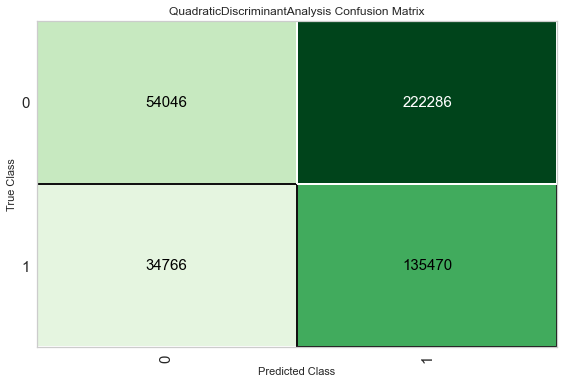

In [31]:
plot_model(qda, plot = 'confusion_matrix',use_train_data=True)

In [36]:
predict_model(qda);   

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Quadratic Discriminant Analysis,0.4244,0.4956,0.7955,0.3786,0.5131,-0.0072,-0.0107


In [37]:
save_model(qda,'qda')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True, features_todrop=[],
                                       id_columns=[],
                                       ml_usecase='classification',
                                       numerical_features=[],
                                       target='PotentialFraud',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categorical=None,
                                 fill_value_numerical=None,
                                 numer...
                 ('dummy', Dummify(target='PotentialFraud')),
                 ('fix_perfect', Remove_100(target='PotentialFraud')),
                 ('clean_names', Clean_Colum_Names()),
                 ('feature_select', 'passthroug

In [33]:
tuned_qda = tune_model(qda,fold=5,choose_better=True)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.6225,0.5983,0.1520,0.5164,0.2348,0.0744,0.0989
1,0.6232,0.5995,0.1489,0.5203,0.2316,0.0746,0.1002
2,0.6237,0.5971,0.1516,0.5221,0.2350,0.0766,0.1023
3,0.6209,0.5936,0.1492,0.5094,0.2308,0.0702,0.0936
4,0.6212,0.5972,0.1454,0.5109,0.2263,0.0691,0.0931
Mean,0.6223,0.5971,0.1494,0.5158,0.2317,0.0730,0.0976
SD,0.0011,0.0020,0.0024,0.0050,0.0032,0.0028,0.0037


In [35]:
predict_model(tuned_qda);    #tuned_qda has less recall as compared to qda as by default it optimises for accuracy.

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Quadratic Discriminant Analysis,0.6233,0.5955,0.1476,0.5209,0.2301,0.0742,0.1001


# Logistics Regression

Fitting the model with 5-fold cross validation on training data and computing various performance metrics.

In [59]:
lr = create_model('lr',fold=5)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.6309,0.5530,0.1012,0.5935,0.1729,0.0696,0.1152
1,0.6318,0.5554,0.1032,0.5989,0.1760,0.0721,0.1188
2,0.6323,0.5540,0.1039,0.6030,0.1772,0.0734,0.1211
3,0.6302,0.5489,0.1005,0.5877,0.1717,0.0679,0.1123
4,0.6305,0.5511,0.0993,0.5912,0.1701,0.0678,0.1131
Mean,0.6311,0.5525,0.1016,0.5948,0.1736,0.0702,0.1161
SD,0.0008,0.0023,0.0017,0.0054,0.0027,0.0022,0.0034


Performance scores on baseline model.

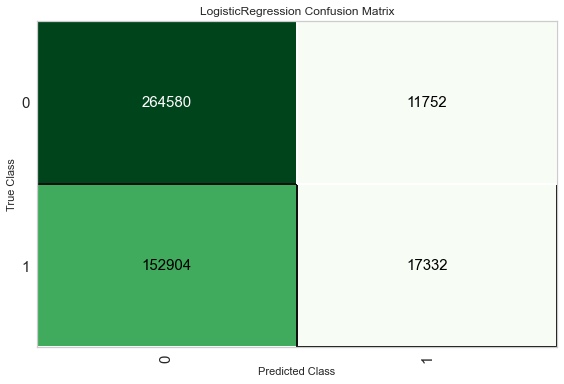

In [30]:
plot_model(lr, plot = 'confusion_matrix',use_train_data=True)           #This plots the confusion matrix on train data.

Observation: Out of 170236 fraudulent claims , it is predicting 152904(89.82%) of claims as non-fraud. Thus, it has very poor recall. But it is good at predicting non-fraud claims and is predicting 264580 claims correctly out of 276332 non-fraud claims. 

Predictions on test data with baseline model.

In [60]:
lr

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=100, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [31]:
predict_model(lr);       #the scores on unseen data is also approximately same.

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Logistic Regression,0.6307,0.5544,0.1002,0.5921,0.1714,0.0686,0.1140


Lets plot confusion matrix on test data

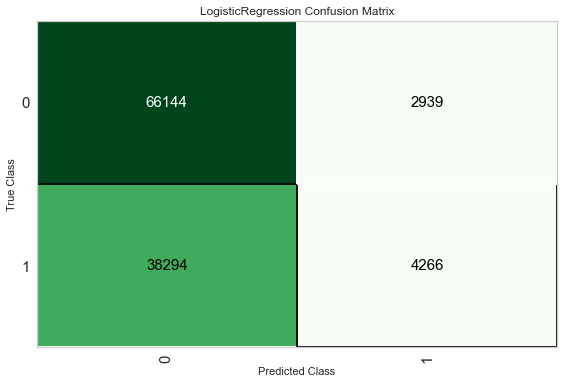

In [38]:
plot_model(lr, plot = 'confusion_matrix')  

In [39]:
#tuning the logistics regression model to optimise for recall 
tuned_lr = tune_model(lr,fold=5,choose_better=True,optimize='Recall')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.6089,0.5546,0.1600,0.4625,0.2378,0.0520,0.0653
1,0.6109,0.5565,0.1582,0.4692,0.2366,0.0549,0.0696
2,0.6103,0.5556,0.1606,0.4677,0.2391,0.0549,0.0691
3,0.6030,0.5507,0.1614,0.4430,0.2366,0.0415,0.0511
4,0.6059,0.5537,0.1588,0.4520,0.2350,0.0459,0.0573
Mean,0.6078,0.5542,0.1598,0.4589,0.2370,0.0498,0.0625
SD,0.0030,0.0020,0.0012,0.0100,0.0014,0.0053,0.0072


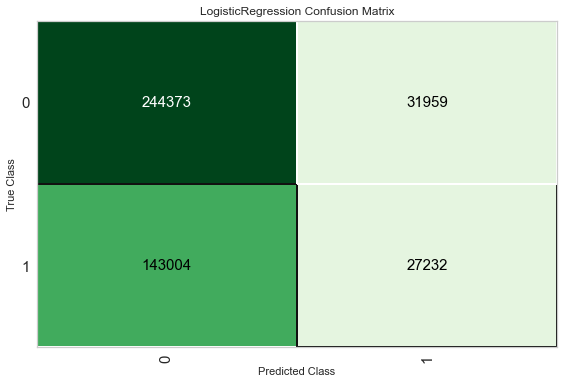

In [48]:
plot_model(tuned_lr, plot = 'confusion_matrix',use_train_data=True)  

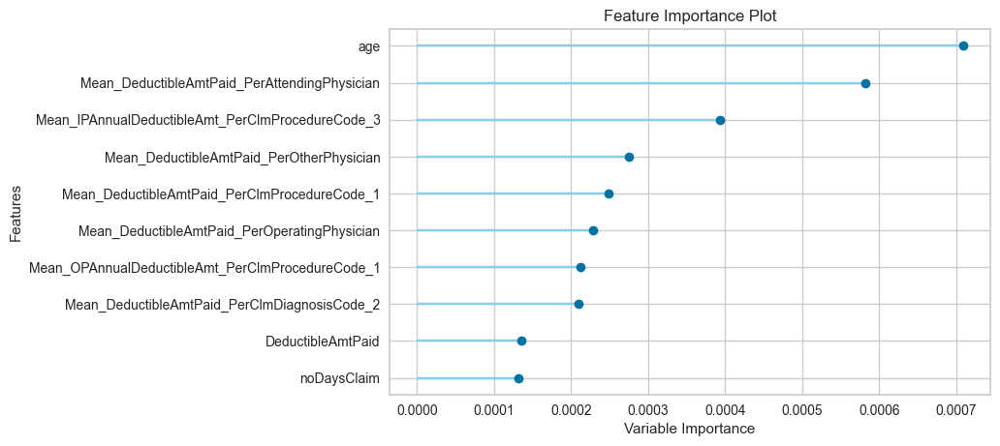

In [41]:
plot_model(tuned_lr, plot='feature')

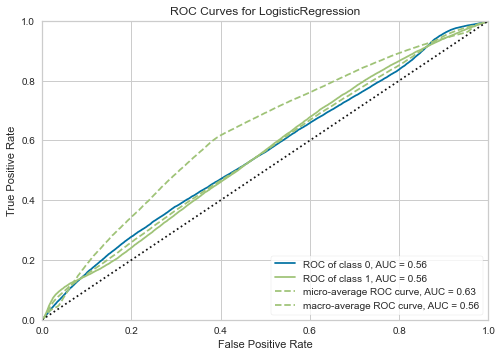

In [42]:
plot_model(tuned_lr, plot = 'auc')

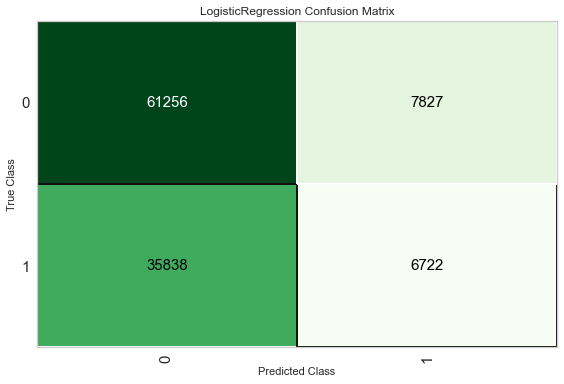

In [49]:
plot_model(tuned_lr, plot = 'confusion_matrix')  

In [43]:
save_model(tuned_lr,'TunedLR')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True, features_todrop=[],
                                       id_columns=[],
                                       ml_usecase='classification',
                                       numerical_features=[],
                                       target='PotentialFraud',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categorical=None,
                                 fill_value_numerical=None,
                                 numer...
                 ('feature_select', 'passthrough'), ('fix_multi', 'passthrough'),
                 ('dfs', 'passthrough'), ('pca', 'passthrough'),
                 ['trained_model',
                  LogisticRegression(C=2.821, class_w

# Decision Tree

In [38]:
dt = create_model('dt',fold=5)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9116,0.9077,0.8915,0.8784,0.8849,0.8131,0.8132
1,0.9086,0.9043,0.8860,0.8757,0.8808,0.8067,0.8067
2,0.9121,0.9077,0.8892,0.8812,0.8852,0.8139,0.8140
3,0.9079,0.9035,0.8851,0.8747,0.8799,0.8052,0.8052
4,0.9094,0.9047,0.8845,0.8787,0.8816,0.8083,0.8083
Mean,0.9099,0.9056,0.8873,0.8777,0.8825,0.8094,0.8095
SD,0.0016,0.0018,0.0027,0.0023,0.0022,0.0035,0.0035


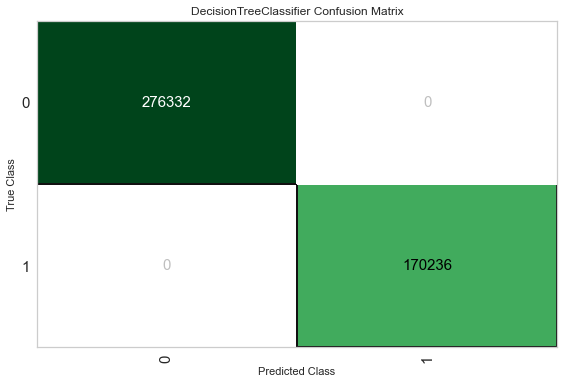

In [33]:
plot_model(dt, plot = 'confusion_matrix',use_train_data=True)      

#this command fits the model on the whole dataset and in pycaret implementation , it overfits on the complete dataset
#That's why we are not getting any False Positives and False Negatives.

In [39]:
predict_model(dt);  

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Decision Tree Classifier,0.6073,0.5761,0.4450,0.4836,0.4635,0.1547,0.1550


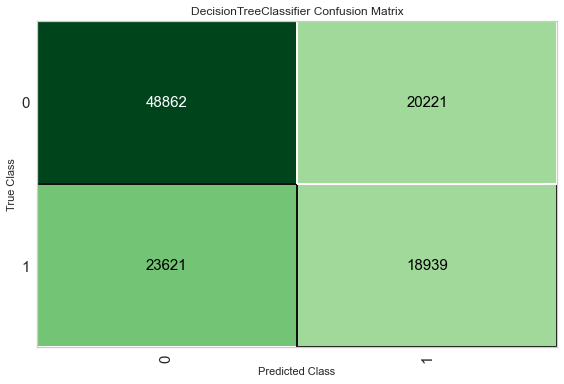

In [36]:
plot_model(dt, plot = 'confusion_matrix')     

In [42]:
save_model(dt,'dt')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True, features_todrop=[],
                                       id_columns=[],
                                       ml_usecase='classification',
                                       numerical_features=[],
                                       target='PotentialFraud',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categorical=None,
                                 fill_value_numerical=None,
                                 numer...
                 ('dfs', 'passthrough'), ('pca', 'passthrough'),
                 ['trained_model',
                  DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                         criterion='gini', m

Tuning the Decesion tree model on accuracy and checking all results on tuned model

In [66]:
tuned_dt = tune_model(dt,fold=3,choose_better=True,optimize='F1')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7029,0.7189,0.4586,0.6583,0.5406,0.3313,0.3431
1,0.7010,0.7132,0.4503,0.6576,0.5345,0.3255,0.3382
2,0.7121,0.7267,0.4475,0.6881,0.5423,0.3458,0.3628
Mean,0.7053,0.7196,0.4521,0.6680,0.5391,0.3342,0.3480
SD,0.0048,0.0055,0.0047,0.0142,0.0034,0.0085,0.0106


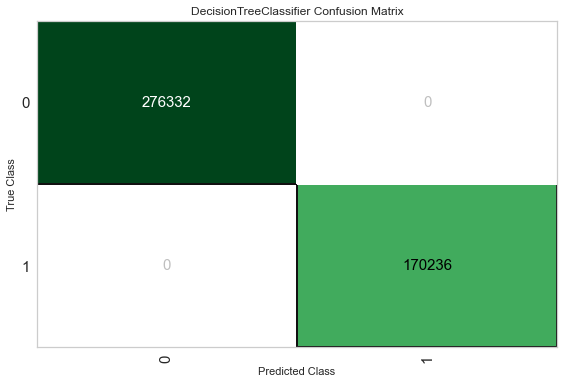

In [38]:
plot_model(tuned_dt, plot = 'confusion_matrix',use_train_data=True)

#this command fits the model on the whole dataset and in pycaret implementation , it overfits on the complete dataset
#That's why we are not getting any False Positives and False Negatives.

In [67]:
predict_model(tuned_dt);  

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Decision Tree Classifier,0.6073,0.5761,0.4450,0.4836,0.4635,0.1547,0.1550


In [68]:
plot_model(tuned_dt, plot = 'confusion_matrix')

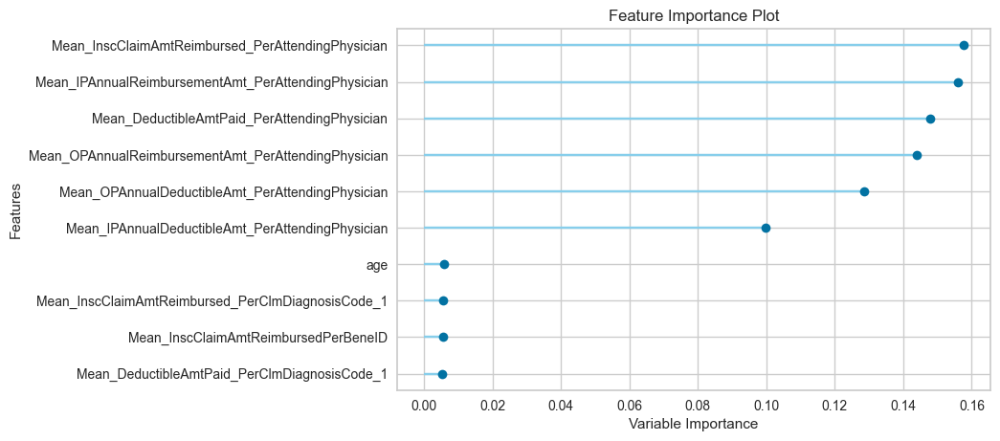

In [41]:
plot_model(tuned_dt, plot='feature')

In [69]:
tuned_dt

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=100, splitter='best')

# LINEAR SVM

In [58]:
svm = create_model('svm',fold=5)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.4671,0.0000,0.6749,0.3862,0.4913,0.0123,0.0145
1,0.5707,0.0000,0.2611,0.4028,0.3169,0.0242,0.0255
2,0.3885,0.0000,0.9627,0.3806,0.5455,-0.0019,-0.0065
3,0.6160,0.0000,0.0133,0.3938,0.0258,0.0008,0.0030
4,0.6188,0.0000,0.0001,0.3333,0.0001,-0.0000,-0.0008
Mean,0.5322,0.0000,0.3824,0.3793,0.2759,0.0071,0.0071
SD,0.0904,0.0000,0.3793,0.0242,0.2278,0.0099,0.0115


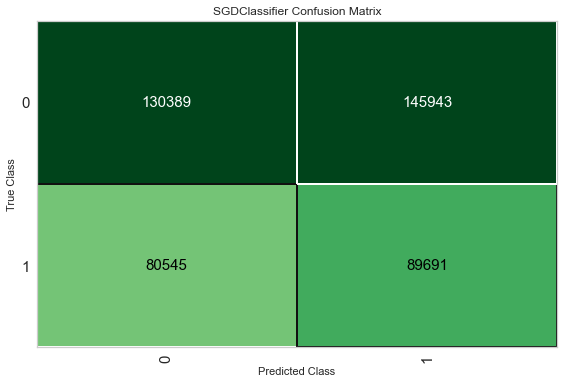

In [59]:
plot_model(svm, plot = 'confusion_matrix',use_train_data=True) 

In [61]:
predict_model(svm);  

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,SVM - Linear Kernel,0.4929,0.4990,0.5250,0.3804,0.4411,-0.0018,-0.0019


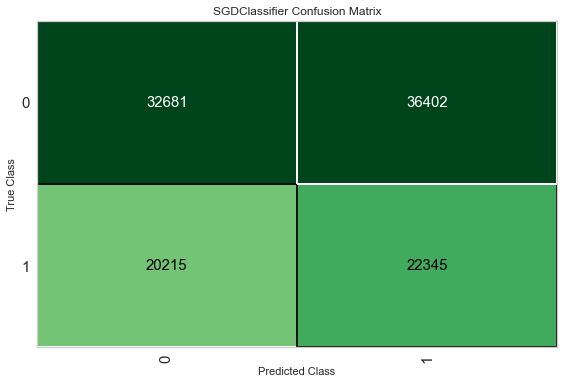

In [62]:
plot_model(svm, plot = 'confusion_matrix') 

# Random Forest

In [44]:
rf = create_model('rf',fold=3)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8619,0.9159,0.6633,0.9631,0.7855,0.6888,0.7148
1,0.8619,0.9150,0.6620,0.9644,0.7851,0.6884,0.7149
2,0.8592,0.9130,0.6580,0.9599,0.7808,0.6823,0.7087
Mean,0.8610,0.9147,0.6611,0.9625,0.7838,0.6865,0.7128
SD,0.0013,0.0012,0.0022,0.0019,0.0021,0.0030,0.0029


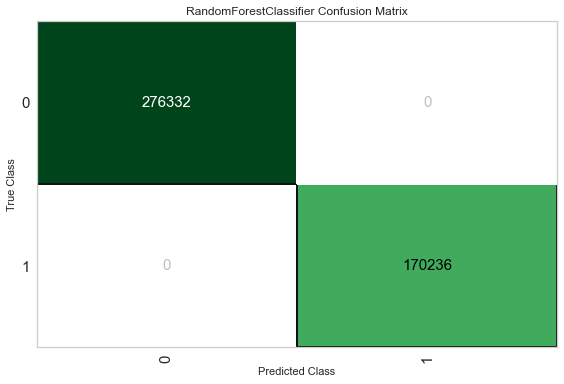

In [43]:
plot_model(rf, plot = 'confusion_matrix',use_train_data=True)

#this command fits the model on the whole dataset and in pycaret implementation , it overfits on the complete dataset
#That's why we are not getting any False Positives and False Negatives.

In [44]:
predict_model(rf)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Random Forest Classifier,0.7167,0.7318,0.4054,0.7317,0.5218,0.3432,0.3734


,InscClaimAmtReimbursed,DeductibleAmtPaid,OPAnnualDeductibleAmt,noDaysAdmit,noDaysClaim,age,TotalAnnualReimbursementAmt,TotalAnnualDeductibleAmt,Mean_InscClaimAmtReimbursed_PerAttendingPhysician,Mean_InscClaimAmtReimbursed_PerOperatingPhysician,...,PatientRiskValue_3,PatientRiskValue_4,PatientRiskValue_5,PatientRiskValue_6,PatientRiskValue_7,PatientRiskValue_8,PatientRiskValue_9,PotentialFraud,Label,Score
0,100.0,0.0,160.0,0.0,1.0,81.0,30500.0,3364.0,124.615387,495.583984,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0,0,0.81
1,90.0,0.0,320.0,0.0,1.0,84.0,22260.0,2456.0,206.250000,495.583984,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0,0,0.71
2,60.0,0.0,40.0,0.0,1.0,78.0,450.0,40.0,244.299774,303.551025,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1,1,0.89
3,3300.0,0.0,1540.0,0.0,1.0,89.0,4730.0,1540.0,231.609192,502.530121,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1,1,0.64
4,50.0,0.0,250.0,0.0,1.0,88.0,6090.0,1318.0,241.866669,495.583984,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1,1,0.61
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
111638,40.0,0.0,1780.0,0.0,1.0,50.0,920.0,1780.0,249.687500,495.583984,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0,0,0.61
111639,60.0,0.0,300.0,0.0,1.0,85.0,3350.0,300.0,47.142857,495.583984,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1,0,0.78
111640,100.0,0.0,520.0,0.0,1.0,53.0,4200.0,520.0,55.000000,495.583984,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.73
111641,100.0,0.0,760.0,0.0,21.0,72.0,6060.0,760.0,70.000000,495.583984,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0,0,0.76


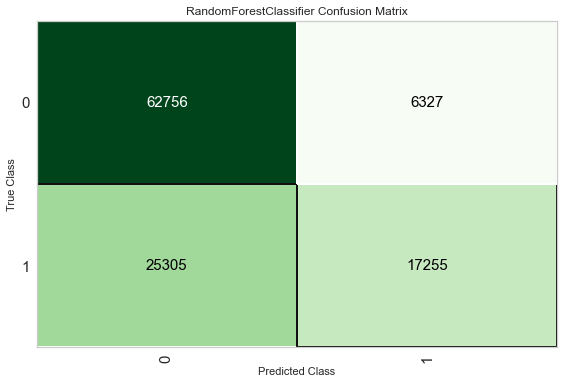

In [45]:
plot_model(rf, plot = 'confusion_matrix')

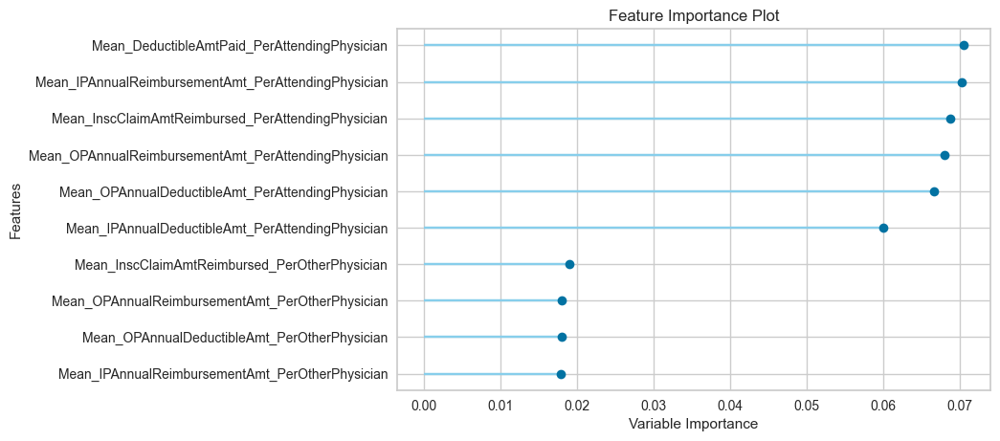

In [46]:
plot_model(rf, plot='feature')

In [48]:
predict_model(rf);

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Random Forest Classifier,0.7167,0.7318,0.4054,0.7317,0.5218,0.3432,0.3734


In [49]:
tuned_rf = tune_model(rf,fold=5,choose_better=True)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.6932,0.6752,0.2934,0.7490,0.4217,0.2636,0.3173
1,0.6998,0.6791,0.2894,0.7898,0.4236,0.2755,0.3390
2,0.7035,0.6771,0.3361,0.7470,0.4636,0.2973,0.3427
3,0.6950,0.6694,0.3004,0.7494,0.4289,0.2695,0.3220
4,0.7001,0.6736,0.3297,0.7392,0.4560,0.2887,0.3336
Mean,0.6983,0.6749,0.3098,0.7549,0.4387,0.2789,0.3309
SD,0.0037,0.0033,0.0193,0.0179,0.0175,0.0124,0.0098


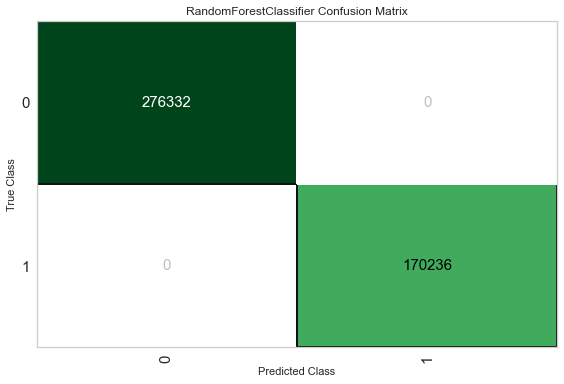

In [60]:
plot_model(tuned_rf, plot = 'confusion_matrix',use_train_data=True)

#this command fits the model on the whole dataset and in pycaret implementation , it overfits on the complete dataset
#That's why we are not getting any False Positives and False Negatives.

In [40]:
predict_model(tuned_rf);       #it has same performace as rf , so we can use any of these.

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Random Forest Classifier,0.7167,0.7318,0.4054,0.7317,0.5218,0.3432,0.3734


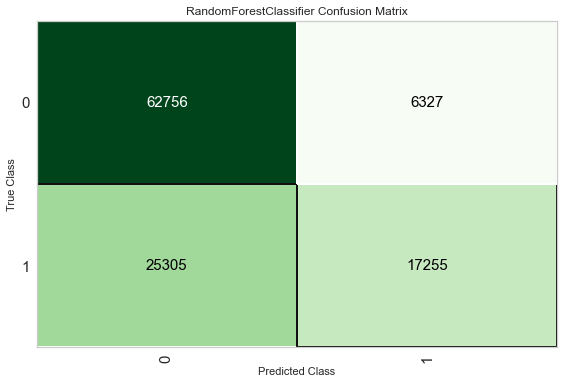

In [41]:
plot_model(tuned_rf, plot = 'confusion_matrix')

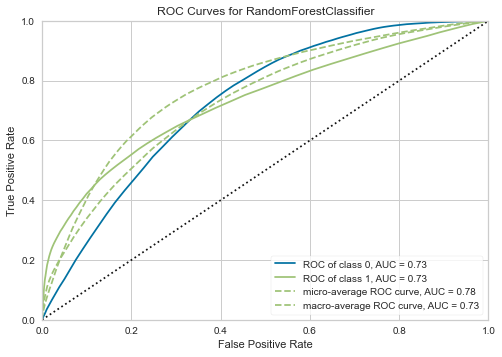

In [42]:
plot_model(tuned_rf, plot = 'auc')

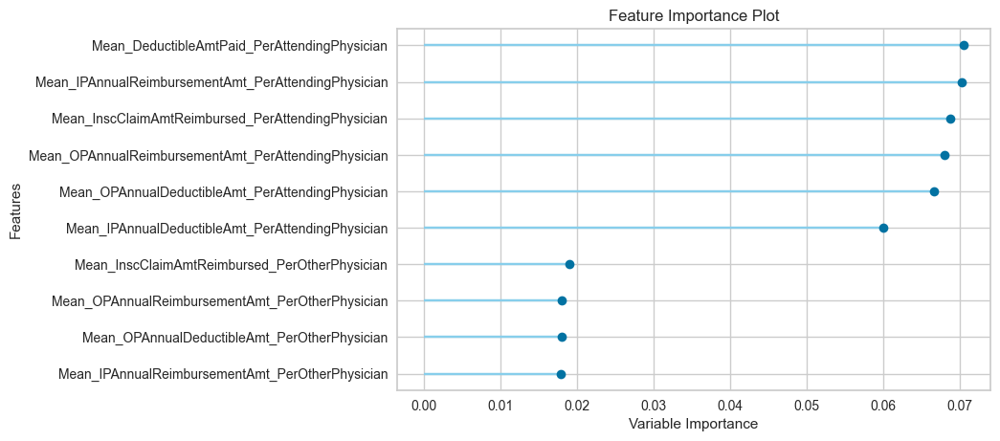

In [43]:
plot_model(tuned_rf, plot='feature')

In [44]:
pycaret.__version__

'2.3.6'

# GBDT

In [42]:
gbc = create_model('gbc',fold=5)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7403,0.7470,0.4531,0.7711,0.5708,0.4021,0.4313
1,0.7459,0.7486,0.4550,0.7891,0.5772,0.4138,0.4458
2,0.7437,0.7440,0.4606,0.7760,0.5781,0.4108,0.4396
3,0.7391,0.7422,0.4503,0.7699,0.5682,0.3992,0.4287
4,0.7418,0.7418,0.4515,0.7779,0.5714,0.4047,0.4354
Mean,0.7422,0.7447,0.4541,0.7768,0.5732,0.4061,0.4362
SD,0.0024,0.0027,0.0036,0.0068,0.0038,0.0054,0.0061


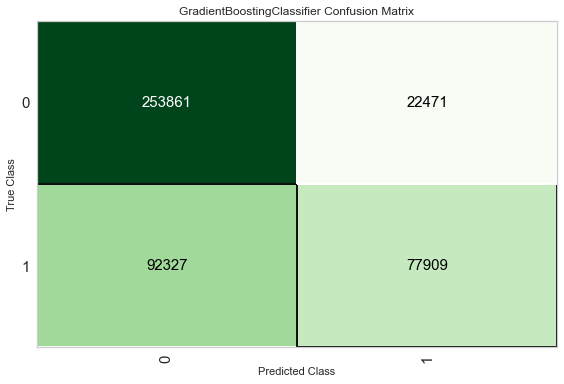

In [43]:
plot_model(gbc, plot = 'confusion_matrix',use_train_data=True)

In [47]:
predict_model(gbc);

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Gradient Boosting Classifier,0.6879,0.6957,0.4398,0.6299,0.5179,0.2978,0.3083


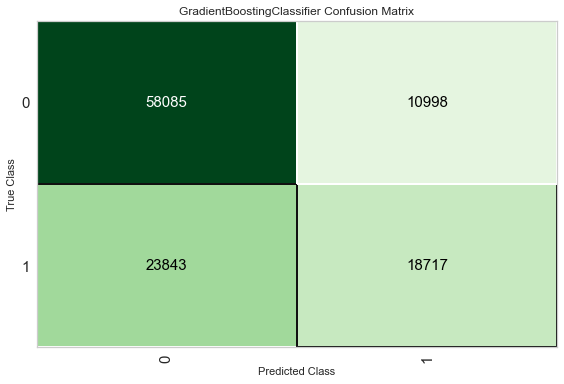

In [48]:
plot_model(gbc, plot = 'confusion_matrix')

In [49]:
tuned_gbc = tune_model(gbc,fold=3,choose_better=True)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9065,0.9515,0.7936,0.9535,0.8662,0.7953,0.8032
1,0.9080,0.9513,0.7948,0.9564,0.8681,0.7984,0.8064
2,0.9069,0.9504,0.7932,0.9549,0.8666,0.7960,0.8041
Mean,0.9071,0.9511,0.7939,0.9549,0.8670,0.7966,0.8046
SD,0.0006,0.0005,0.0007,0.0012,0.0008,0.0013,0.0013


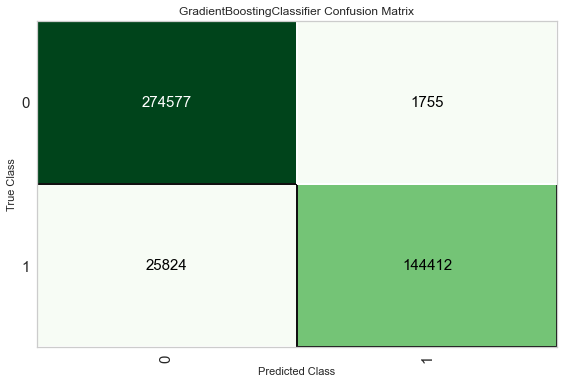

In [56]:
plot_model(tuned_gbc, plot = 'confusion_matrix',use_train_data=True)

In [57]:
predict_model(tuned_gbc);      #it has slightly increased Precision from gbc , but overall performance of gbc is better.

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Gradient Boosting Classifier,0.6673,0.6710,0.4871,0.5751,0.5274,0.2734,0.2757


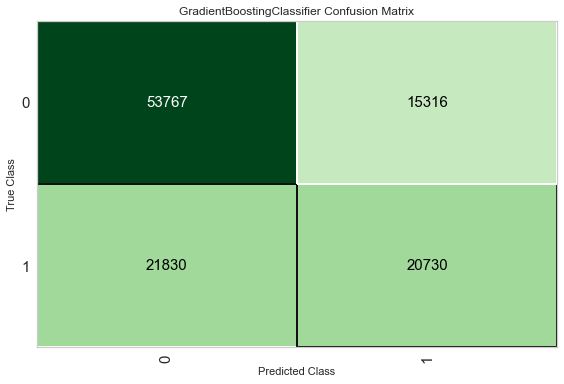

In [58]:
plot_model(tuned_gbc, plot = 'confusion_matrix')

# AdaBoost

In [37]:
ada = create_model('ada',fold=5)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7054,0.7068,0.4458,0.6710,0.5357,0.3326,0.3475
1,0.7081,0.7092,0.4526,0.6746,0.5417,0.3396,0.3541
2,0.7079,0.7076,0.4440,0.6787,0.5368,0.3369,0.3531
3,0.7011,0.7018,0.4407,0.6623,0.5292,0.3230,0.3374
4,0.7041,0.7037,0.4504,0.6652,0.5371,0.3313,0.3449
Mean,0.7053,0.7058,0.4467,0.6704,0.5361,0.3327,0.3474
SD,0.0026,0.0027,0.0043,0.0060,0.0040,0.0057,0.0061


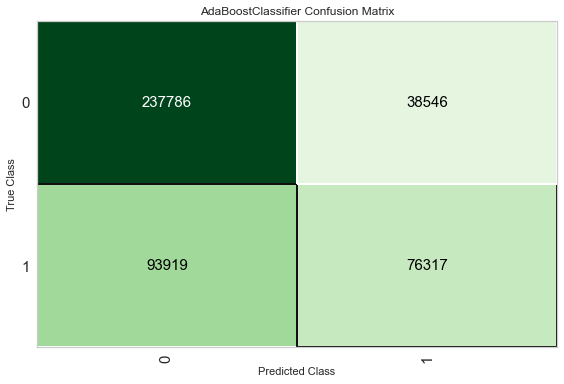

In [38]:
plot_model(ada, plot = 'confusion_matrix',use_train_data=True)

In [39]:
predict_model(ada);

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Ada Boost Classifier,0.6807,0.6900,0.4910,0.5992,0.5397,0.2990,0.3025


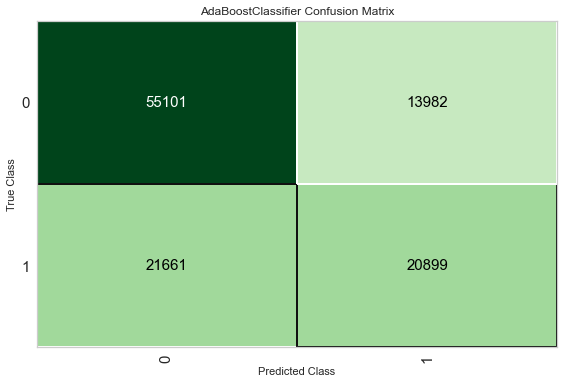

In [40]:
plot_model(ada, plot = 'confusion_matrix')

In [41]:
tuned_ada = tune_model(ada,fold=3,choose_better=True)  #tuned_ada also hasn't much improved performance

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7114,0.7130,0.4340,0.6942,0.5341,0.3408,0.3605
1,0.7139,0.7124,0.4429,0.6962,0.5414,0.3481,0.3669
2,0.7111,0.7088,0.4371,0.6915,0.5356,0.3410,0.3599
Mean,0.7121,0.7114,0.4380,0.6940,0.5370,0.3433,0.3625
SD,0.0013,0.0019,0.0037,0.0019,0.0031,0.0034,0.0032


In [68]:
predict_model(tuned_ada);   #It has slightly increased Precision but Recall and F1 score of ada are slighly better.

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Ada Boost Classifier,0.6819,0.6909,0.4770,0.6050,0.5334,0.2972,0.3020


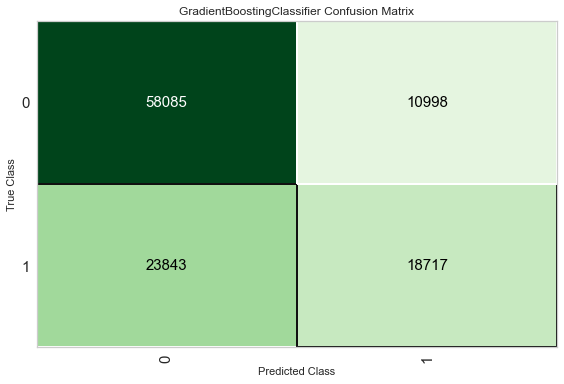

In [69]:
plot_model(tuned_ada, plot = 'confusion_matrix')

# LIGHT GBM

In [29]:
lightgbm = create_model('lightgbm',fold=5)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8205,0.8610,0.5711,0.9316,0.7081,0.5890,0.6258
1,0.8214,0.8612,0.5709,0.9355,0.7091,0.5909,0.6284
2,0.8217,0.8588,0.5738,0.9324,0.7104,0.5919,0.6283
3,0.8157,0.8548,0.5610,0.9266,0.6989,0.5774,0.6151
4,0.8169,0.8544,0.5597,0.9334,0.6998,0.5797,0.6189
Mean,0.8193,0.8580,0.5673,0.9319,0.7053,0.5858,0.6233
SD,0.0025,0.0030,0.0058,0.0029,0.0049,0.0060,0.0054


In [30]:
predict_model(lightgbm)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Light Gradient Boosting Machine,0.7133,0.7172,0.4558,0.6867,0.5479,0.3503,0.3661


,InscClaimAmtReimbursed,DeductibleAmtPaid,OPAnnualDeductibleAmt,noDaysAdmit,noDaysClaim,age,TotalAnnualReimbursementAmt,TotalAnnualDeductibleAmt,Mean_InscClaimAmtReimbursed_PerAttendingPhysician,Mean_InscClaimAmtReimbursed_PerOperatingPhysician,...,PatientRiskValue_3,PatientRiskValue_4,PatientRiskValue_5,PatientRiskValue_6,PatientRiskValue_7,PatientRiskValue_8,PatientRiskValue_9,PotentialFraud,Label,Score
0,100.0,0.0,160.0,0.0,1.0,81.0,30500.0,3364.0,124.615387,495.583984,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0,0,0.7854
1,90.0,0.0,320.0,0.0,1.0,84.0,22260.0,2456.0,206.250000,495.583984,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0,0,0.7692
2,60.0,0.0,40.0,0.0,1.0,78.0,450.0,40.0,244.299774,303.551025,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1,1,0.9439
3,3300.0,0.0,1540.0,0.0,1.0,89.0,4730.0,1540.0,231.609192,502.530121,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1,1,0.7138
4,50.0,0.0,250.0,0.0,1.0,88.0,6090.0,1318.0,241.866669,495.583984,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1,1,0.5448
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
111638,40.0,0.0,1780.0,0.0,1.0,50.0,920.0,1780.0,249.687500,495.583984,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0,0,0.5892
111639,60.0,0.0,300.0,0.0,1.0,85.0,3350.0,300.0,47.142857,495.583984,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1,0,0.7289
111640,100.0,0.0,520.0,0.0,1.0,53.0,4200.0,520.0,55.000000,495.583984,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.8036
111641,100.0,0.0,760.0,0.0,21.0,72.0,6060.0,760.0,70.000000,495.583984,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0,0,0.7884


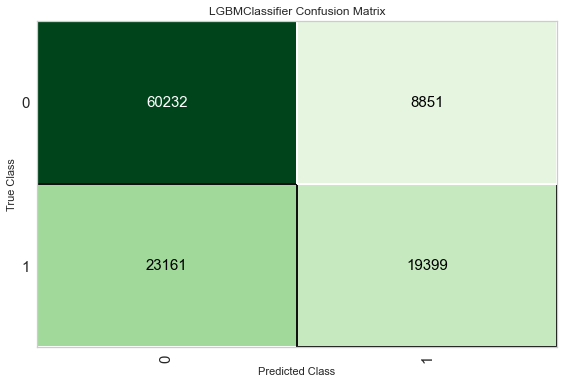

In [31]:
plot_model(lightgbm,plot='confusion_matrix')

In [59]:
save_model(lightgbm,'lightgbm')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True, features_todrop=[],
                                       id_columns=[],
                                       ml_usecase='classification',
                                       numerical_features=[],
                                       target='PotentialFraud',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categorical=None,
                                 fill_value_numerical=None,
                                 numer...
                  LGBMClassifier(boosting_type='gbdt', class_weight=None,
                                 colsample_bytree=1.0, importance_type='split',
                                 learning_rate=0.1, max_depth=-1,
               

In [32]:
tuned_lightgbm = tune_model(lightgbm,fold=5,choose_better=True)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9056,0.9559,0.7916,0.9527,0.8647,0.7932,0.8012
1,0.9035,0.9537,0.7850,0.9535,0.8611,0.7882,0.7969
2,0.9046,0.9546,0.7875,0.9543,0.8629,0.7908,0.7994
3,0.8984,0.9487,0.7748,0.9492,0.8532,0.7767,0.7861
4,0.9044,0.9547,0.7867,0.9544,0.8625,0.7902,0.7989
Mean,0.9033,0.9535,0.7851,0.9528,0.8609,0.7878,0.7965
SD,0.0025,0.0025,0.0056,0.0019,0.0040,0.0058,0.0054


In [33]:
predict_model(tuned_lightgbm)    #Tuned Lightgbm is not performing well on test data. So we will use lightgbm only.

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Light Gradient Boosting Machine,0.6666,0.6525,0.4172,0.5885,0.4882,0.2515,0.2597


,InscClaimAmtReimbursed,DeductibleAmtPaid,OPAnnualDeductibleAmt,noDaysAdmit,noDaysClaim,age,TotalAnnualReimbursementAmt,TotalAnnualDeductibleAmt,Mean_InscClaimAmtReimbursed_PerAttendingPhysician,Mean_InscClaimAmtReimbursed_PerOperatingPhysician,...,PatientRiskValue_3,PatientRiskValue_4,PatientRiskValue_5,PatientRiskValue_6,PatientRiskValue_7,PatientRiskValue_8,PatientRiskValue_9,PotentialFraud,Label,Score
0,100.0,0.0,160.0,0.0,1.0,81.0,30500.0,3364.0,124.615387,495.583984,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0,0,0.6742
1,90.0,0.0,320.0,0.0,1.0,84.0,22260.0,2456.0,206.250000,495.583984,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0,0,0.8733
2,60.0,0.0,40.0,0.0,1.0,78.0,450.0,40.0,244.299774,303.551025,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1,1,0.8978
3,3300.0,0.0,1540.0,0.0,1.0,89.0,4730.0,1540.0,231.609192,502.530121,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1,0,0.7957
4,50.0,0.0,250.0,0.0,1.0,88.0,6090.0,1318.0,241.866669,495.583984,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1,1,0.7720
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
111638,40.0,0.0,1780.0,0.0,1.0,50.0,920.0,1780.0,249.687500,495.583984,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0,1,0.5558
111639,60.0,0.0,300.0,0.0,1.0,85.0,3350.0,300.0,47.142857,495.583984,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1,0,0.9195
111640,100.0,0.0,520.0,0.0,1.0,53.0,4200.0,520.0,55.000000,495.583984,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.9153
111641,100.0,0.0,760.0,0.0,21.0,72.0,6060.0,760.0,70.000000,495.583984,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0,0,0.8225


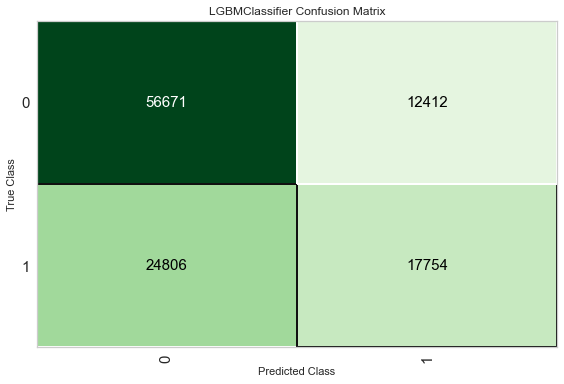

In [34]:
plot_model(tuned_lightgbm,plot='confusion_matrix')

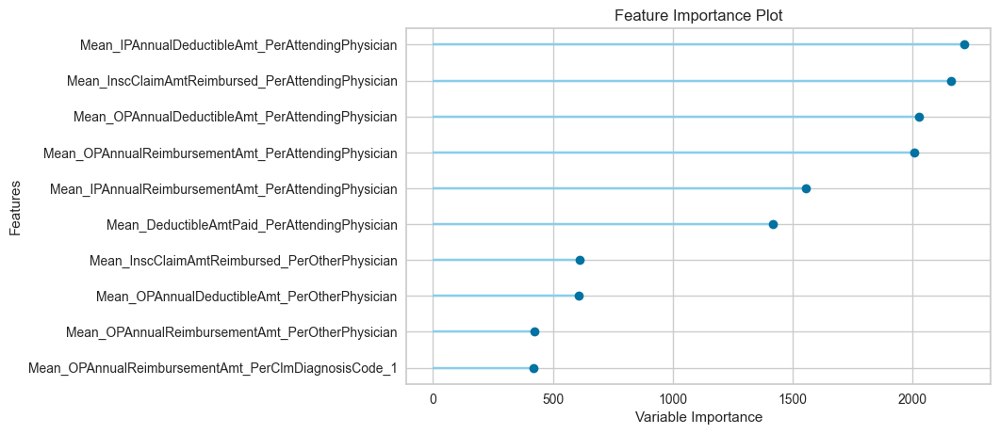

In [33]:
plot_model(tuned_lightgbm,plot='feature')

# Comparisons of all models on test dataset

In [29]:
compare_models(include=['lr','dt','rf','qda','ada','mlp','gbc','lightgbm'],cross_validation=False)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.7167,0.7318,0.4054,0.7317,0.5218,0.3432,0.3734,91.0800
lightgbm,Light Gradient Boosting Machine,0.7133,0.7172,0.4558,0.6867,0.5479,0.3503,0.3661,7.3200
gbc,Gradient Boosting Classifier,0.6879,0.6957,0.4398,0.6299,0.5179,0.2978,0.3083,593.1500
ada,Ada Boost Classifier,0.6807,0.6900,0.4910,0.5992,0.5397,0.2990,0.3025,140.1200
lr,Logistic Regression,0.6307,0.5544,0.1002,0.5921,0.1714,0.0686,0.1140,150.2500
mlp,MLP Classifier,0.6188,0.5001,0.0000,0.4000,0.0001,0.0000,0.0003,246.1500
dt,Decision Tree Classifier,0.6073,0.5761,0.4450,0.4836,0.4635,0.1547,0.1550,46.7500
qda,Quadratic Discriminant Analysis,0.4244,0.4956,0.7955,0.3786,0.5131,-0.0072,-0.0107,15.1600


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=100, verbose=0,
                       warm_start=False)

From the model performance scores , we find that we are getting better precision in Random Forest but better recall in Boosting models like AdaBoost & Light GBM. We can analyse both Random Forest and LightGBM further and later more blended models can be created using these two.

# Analysis

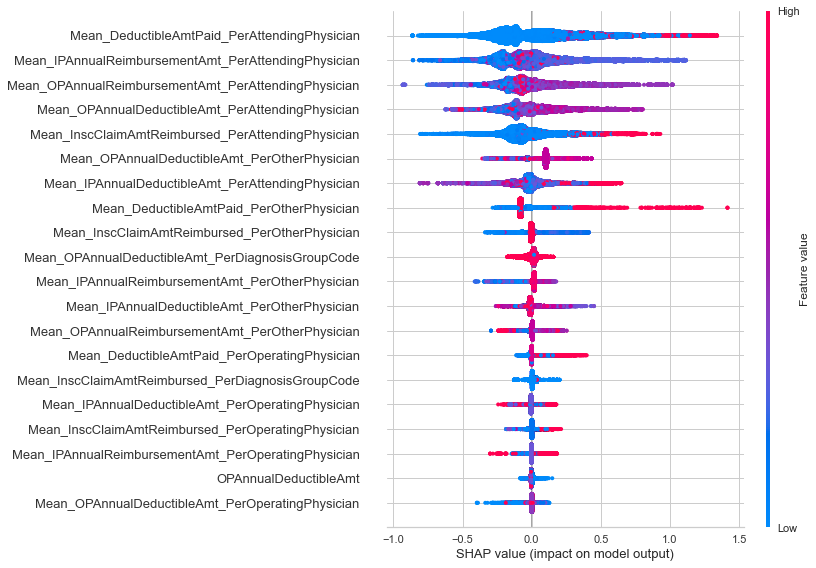

In [44]:
interpret_model(lightgbm)

In the above graph , we observe various features that are correlated with the output variable shown in descending order. The red points are the ones which are contributing more towards the Non Fraud prediction and the blue ones is for the Fraud Prediction contribution.

In [36]:
interpret_model(lightgbm,plot='pfi')

142it [13:59,  5.91s/it] 


In [30]:
df=predict_model(lightgbm)     #storing test dataset results in a dataframe df

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Light Gradient Boosting Machine,0.7133,0.7172,0.4558,0.6867,0.5479,0.3503,0.3661


Observation: The above plot represents the important features that contributed towards the predictions. It uses SHAP library to come up with these features. From here , we observe that most of the amounts such as Deductible paid , Claim Reimbursed amount 
are the most correlated features with the prediction. 

# Error Analysis

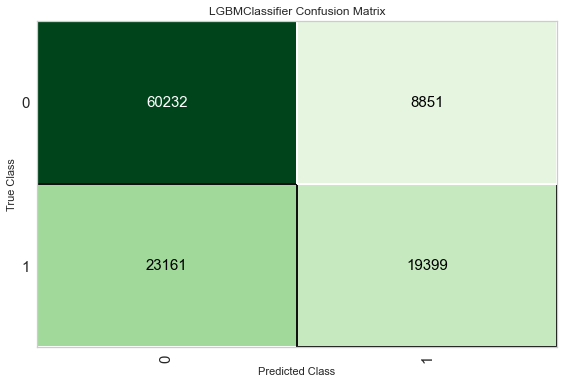

In [38]:
#confusion matrix for lightgbm on test set
plot_model(lightgbm,plot='confusion_matrix')

We can see that:
-8851 points which are non-fraud, but have been predicted as Fraud.
-23161 points are fraud but have been prediced as Non-fraud.
-60232 + 19399 points have been correctly classified.
Now we will plot distribution of important features for correctly classified and misclassified points

Now we will group our points into 4 groups.(TP,TN,FP,FN)

1)Points which are correctly classified and provided & predicted label = 1    #True Positive
2)Points which are correctly classified and provided & predicted label = 0    #True Negative
3)Points which are misclassified and provided label =0 ,predicted label =1    #False Positive
4)Points which are misclassified and provided label =0 ,predicted label =0    #False Negative

We will use SHAP values to see which features are contributing in the prediction of all of these 4 categories.

In [31]:
TP=df[(df.PotentialFraud==df.Label) & (df.Label==1)].sort_values(by=['Score'],ascending=False)
TN=df[(df.PotentialFraud==df.Label) & (df.Label==0)].sort_values(by=['Score'],ascending=False)
FP=df[(df.PotentialFraud!=df.Label) & (df.Label==1)].sort_values(by=['Score'],ascending=False)
FN=df[(df.PotentialFraud!=df.Label) & (df.Label==0)].sort_values(by=['Score'],ascending=False)

len(TP),len(TN),len(FP),len(FN)           #we can see that length matches the values from confusion matrix.

(19399, 60232, 8851, 23161)

In [77]:
#We will find the index in each of these dataframes for points with highest and lowest score.
#And analyse for each point as to which feature is contributing for its prediction.

indexes=[TP.index.values[0],TP.index.values[-1],TN.index.values[0],TN.index.values[-1],
         FP.index.values[0],FP.index.values[-1],FN.index.values[0],FN.index.values[-1]]
indexes

[40078, 24370, 77267, 72710, 20822, 108621, 69016, 36187]

In [78]:
df.iloc[indexes][['PotentialFraud','Label','Score']]

#The below table shows the points that we are going to analyse and we will see which features contribute to its prediction.
# We have taken 2 points each from TP,TN,FP,FN with both high and low probability scores.

,PotentialFraud,Label,Score
40078,1,1,0.9784
24370,1,1,0.5000
77267,0,0,0.9325
72710,0,0,0.5000
20822,0,1,0.9543
108621,0,1,0.5000
69016,1,0,0.8805
36187,1,0,0.5000


# In all these plots , blue arrows shows the features which contribute to Fraud label and red arrows shows features contributing to Non-Fraud label.

In [93]:
interpret_model(lightgbm,plot='reason',observation=indexes[0],save=True)

The above datapoint is True Positive i.e(provided and predicted label is Fraud) with high probability(0.9784).For this user , we can see :

COLUMNS CONTRIBUTING TOWARDS PREDICTION:
Mean_IPAnnualReimbursementAmt_PerAttendingPhysician
Mean_DeductibleAmtPaid_PerAttendingPhysician
Mean_OPAnnualDeductibleAmt_PerAttendingPhysician
Mean_OPAnnualReimbursementAmt_PerAttendingPhysician
Mean_InscClaimAmtReimbursed_PerAttendingPhysician
Mean_InscClaimAmtReimbursed_PerOtherPhysician
Mean_IPAnnualDeductibleAmt_PerAttendingPhysician
Mean_DeductibleAmtPaid_PerOperatingPhysician
Mean_DeductibleAmtPaid_PerOtherPhysician

COLUMNS CONTRIBUTING AGAINST PREDICTION:
Mean_OPAnnualReimbursementAmt_PerOperatingPhysician
Mean_IPAnnualDeductibleAmt_PerOperatingPhysician

In [94]:
interpret_model(lightgbm,plot='reason',observation=indexes[1],save=True)

The above datapoint is True Positive i.e(provided and predicted label Fraud) with low probability(0.5).For this user , we can see :

COLUMNS CONTRIBUTING TOWARDS PREDICTION:
Mean_DeductibleAmtPaid_PerAttendingPhysician
Mean_IPAnnualReimbursementAmt_PerAttendingPhysician
Mean_OPAnnualReimbursementAmt_PerOtherPhysician
Mean_OPAnnualDeductibleAmt_PerAttendingPhysician
Mean_IPAnnualDeductibleAmt_PerAttendingPhysician
Mean_InscClaimAmtReimbursed_PerOperatingPhysician


COLUMNS CONTRIBUTING AGAINST PREDICTION:
Mean_OPAnnualReimbursementAmt_PerAttendingPhysician
Mean_InscClaimAmtReimbursed_PerAttendingPhysician
Mean_DeductibleAmtPaid_PerOtherPhysician
Mean_DeductibleAmtPaid_PerOperatingPhysician
Mean_OPAnnualReimbursementAmt_PerOperatingPhysician
Mean_IPAnnualDeductibleAmt_PerOperatingPhysician

In [95]:
interpret_model(lightgbm,plot='reason',observation=indexes[2],save=True)

The above datapoint is True Negative i.e(provided and predicted label Non-Fraud) with high probability(0.932).For this user , we can see :

COLUMNS CONTRIBUTING TOWARDS PREDICTION:
Mean_DeductibleAmtPaid_PerAttendingPhysician
Mean_IPAnnualReimbursementAmt_PerAttendingPhysician
Mean_OPAnnualReimbursementAmt_PerOtherPhysician
Mean_OPAnnualDeductibleAmt_PerAttendingPhysician
Mean_IPAnnualDeductibleAmt_PerAttendingPhysician
Mean_InscClaimAmtReimbursed_PerOperatingPhysician


COLUMNS CONTRIBUTING AGAINST PREDICTION:
Mean_OPAnnualDeductibleAmt_PerDiagnosisGroupCode
Mean_IPAnnualDeductibleAmt_PerOperatingPhysician

In [100]:
interpret_model(lightgbm,plot='reason',observation=indexes[3],save=True)

The above datapoint is True Negative i.e(provided and predicted label Non-Fraud) with low probability(0.5).For this user , we can see :

COLUMNS CONTRIBUTING TOWARDS PREDICTION:
Mean_OPAnnualDeductibleAmt_PerAttendingPhysician
Mean_IPAnnualDeductibleAmt_PerAttendingPhysician
Mean_IPAnnualDeductibleAmt_PerOtherPhysician
Mean_IPAnnualDeductibleAmt_PerOperatingPhysician


COLUMNS CONTRIBUTING AGAINST PREDICTION:
Mean_DeductibleAmtPaid_PerAttendingPhysician
Mean_InscClaimAmtReimbursed_PerAttendingPhysician
Mean_OPAnnualDeductibleAmt_PerOtherPhysician
Mean_OPAnnualDeductibleAmt_PerDiagnosisGroupCode
Mean_IPAnnualReimbursementAmt_PerOtherPhysician

In [101]:
interpret_model(lightgbm,plot='reason',observation=indexes[4],save=True)

The above datapoint is False Positive i.e(provided label Non Fraud and predicted label Fraud) with high probability(0.9543).For this user , we can see :

COLUMNS CONTRIBUTING TOWARDS PREDICTION:
Mean_DeductibleAmtPaid_PerAttendingPhysician
Mean_InscClaimAmtReimbursed_PerAttendingPhysician
Mean_IPAnnualDeductibleAmt_PerAttendingPhysician
Mean_IPAnnualReimbursementAmt_PerAttendingPhysician
Mean_OPAnnualReimbursementAmt_PerAttendingPhysician
Mean_DeductibleAmtPaid_PerOperatingPhysician
Mean_OPAnnualDeductibleAmt_PerAttendingPhysician
noDaysAdmit
Mean_OPAnnualDeductibleAmt_PerOtherPhysician
Mean_InscClaimAmtReimbursed_PerOperatingPhysician


COLUMNS CONTRIBUTING AGAINST PREDICTION
Mean_DeductibleAmtPaid_PerOtherPhysician
Mean_IPAnnualDeductibleAmt_PerDiagnosisGroupCode


In [102]:
interpret_model(lightgbm,plot='reason',observation=indexes[5],save=True)

The above datapoint is False Positive i.e(provided label Fraud and predicted label NonFraud) with low probability(0.5).For this user , we can see :

COLUMNS CONTRIBUTING TOWARDS PREDICTION:
Mean_DeductibleAmtPaid_PerOperatingPhysician
Mean_InscClaimAmtReimbursed_PerAttendingPhysician
Mean_OPAnnualDeductibleAmt_PerOtherPhysician
Mean_OPAnnualReimbursementAmt_PerAttendingPhysician
Mean_IPAnnualDeductibleAmt_PerOperatingPhysician
Mean_IPAnnualDeductibleAmt_PerAttendingPhysician
Mean_OPAnnualReimbursementAmt_PerOperatingPhysician


COLUMNS CONTRIBUTING AGAINST PREDICTION
Mean_DeductibleAmtPaid_PerOtherPhysician
Mean_DeductibleAmtPaid_PerAttendingPhysician
Mean_OPAnnualReimbursementAmt_PerAttendingPhysician
Mean_IPAnnualDeductibleAmt_PerOtherPhysician

In [103]:
interpret_model(lightgbm,plot='reason',observation=indexes[6],save=True)

The above datapoint is False Negative i.e(provided label is NonFraud and predicted label is Fraud) with high probability(0.8805).For this user , we can see :

COLUMNS CONTRIBUTING TOWARDS PREDICTION:
Mean_InscClaimAmtReimbursed_PerAttendingPhysician
Mean_IPAnnualReimbursementAmt_PerAttendingPhysician
Mean_OPAnnualReimbursementAmt_PerAttendingPhysician
Mean_DeductibleAmtPaid_PerAttendingPhysician
Mean_OPAnnualReimbursementAmt_PerAttendingPhysician
Mean_OPAnnualDeductibleAmt_PerDiagnosisGroupCode
Mean_DeductibleAmtPaid_PerOtherPhysician


COLUMNS CONTRIBUTING AGAINST PREDICTION
Mean_OPAnnualDeductibleAmt_PerOtherPhysician
Mean_IPAnnualDeductibleAmt_PerOtherPhysician
Mean_InscClaimAmtReimbursed_PerDiagnosisGroupCode


In [104]:
interpret_model(lightgbm,plot='reason',observation=indexes[7],save=True)

The above datapoint is False Negative i.e(provided label is NonFraud and predicted label is Fraud) with low probability(0.5).For this user , we can see :

COLUMNS CONTRIBUTING TOWARDS PREDICTION:
Mean_OPAnnualDeductibleAmt_PerAttendingPhysician
Mean_DeductibleAmtPaid_PerOtherPhysician
Mean_IPAnnualReimbursementAmt_PerAttendingPhysician
Mean_IPAnnualDeductibleAmt_PerAttendingPhysician
Mean_DeductibleAmtPaid_PerAttendingPhysician
Mean_OPAnnualDeductibleAmt_PerOperatingPhysician
Mean_InscClaimAmtReimbursed_PerDiagnosisGroupCode


COLUMNS CONTRIBUTING AGAINST PREDICTION:
Mean_OPAnnualReimbursementAmt_PerAttendingPhysician
Mean_InscClaimAmtReimbursed_PerAttendingPhysician
Mean_OPAnnualReimbursementAmt_PerDiagnosisGroupCode
Mean_IPAnnualReimbursementAmt_PerOtherPhysician


# Now we will plot distributions of various features b/w TP,FP,TN,FN datapoints

In [40]:
#creating a new column 'category' in df which will tell which category , each point belongs to(TP,TN,FP,FN)
df['Category']=''
df.loc[((df.PotentialFraud==1) & (df.Label==1)), 'Category'] = 'TP'
df.loc[((df.PotentialFraud==0) & (df.Label==0)), 'Category'] = 'TN'
df.loc[((df.PotentialFraud==0) & (df.Label==1)), 'Category'] = 'FP'
df.loc[((df.PotentialFraud==1) & (df.Label==0)), 'Category'] = 'FN'

In [51]:
#Mean_DeductibleAmtPaid_PerAttendingPhysician for True Positives and False Positives
plt.figure(figsize=(10,5))
sns.kdeplot(TP.Mean_DeductibleAmtPaid_PerAttendingPhysician, color='r', shade=True, Label='True Positives')
sns.kdeplot(FP.Mean_DeductibleAmtPaid_PerAttendingPhysician, color='b', shade=True, Label='False Positives')
  
plt.xlabel('Mean_DeductibleAmtPaid_PerAttendingPhysician')
plt.ylabel('Probability Density')
plt.legend()
plt.show()

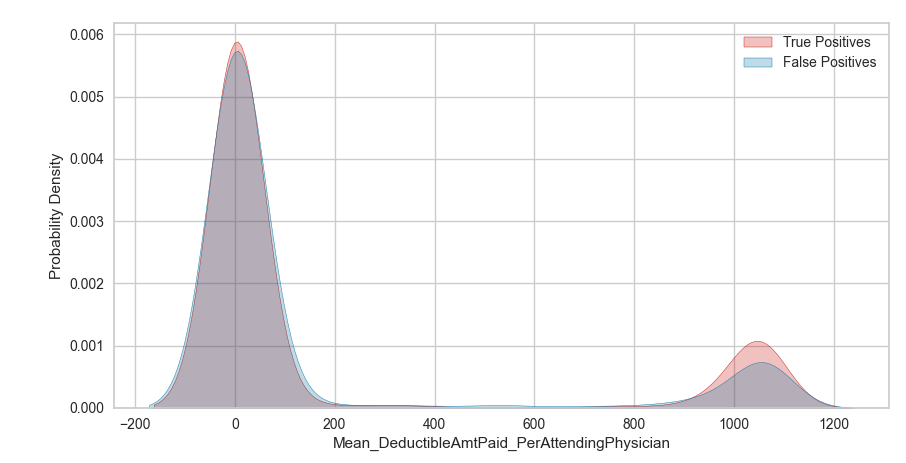

Observation: We saw from SHAP plots that 'Mean_DeductibleAmtPaid_PerAttendingPhysician' feature is contributing in both True Positives and False positives for the prediction. And from the above plots , we can see that both the distribution are exactly same which implies that model is considering this as an important factor in prediction and NonFraud points which have this behaviour, it is predicting those points also as Fraud. So , this is one of the drawbacks of our model.

[]

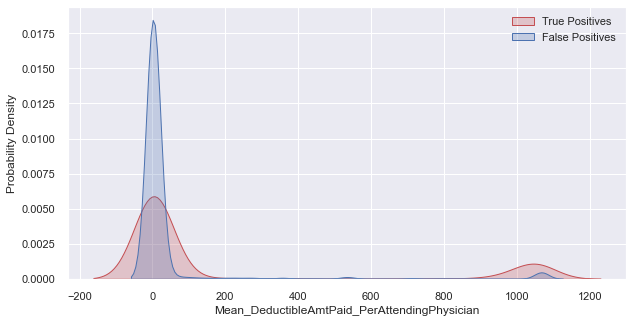

In [112]:
#Mean_DeductibleAmtPaid_PerAttendingPhysician for True Positives and False Positives
plt.figure(figsize=(10,5))
sns.kdeplot(TP.Mean_DeductibleAmtPaid_PerAttendingPhysician, color='r', shade=True, Label='True Positives')
sns.kdeplot(TN.Mean_DeductibleAmtPaid_PerAttendingPhysician, color='b', shade=True, Label='False Positives')
  
plt.xlabel('Mean_DeductibleAmtPaid_PerAttendingPhysician')
plt.ylabel('Probability Density')
plt.legend()
plt.show()

[]

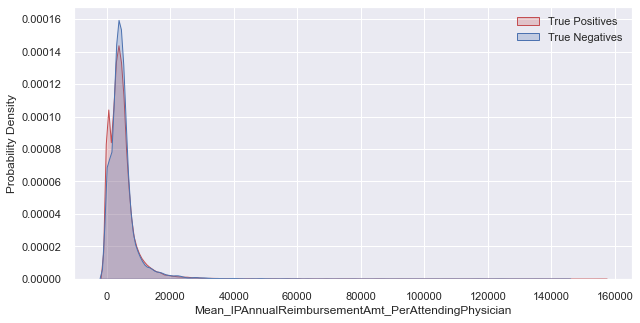

In [113]:
#Mean_IPAnnualReimbursementAmt_PerAttendingPhysician for True Positives and False Positives
plt.figure(figsize=(10,5))
sns.kdeplot(TN.Mean_IPAnnualReimbursementAmt_PerAttendingPhysician, color='r', shade=True, Label='True Negatives')
sns.kdeplot(FN.Mean_IPAnnualReimbursementAmt_PerAttendingPhysician, color='b', shade=True, Label='False Negatives')
  
plt.xlabel('Mean_IPAnnualReimbursementAmt_PerAttendingPhysician')
plt.ylabel('Probability Density')
plt.legend()
plt.plot()

Observation: For this features , there is not much of a difference b/w values of True Positives and True Negatives and this isn't contributing much to our correct predictions.

<AxesSubplot:xlabel='Category', ylabel='Mean_IPAnnualReimbursementAmt_PerAttendingPhysician'>

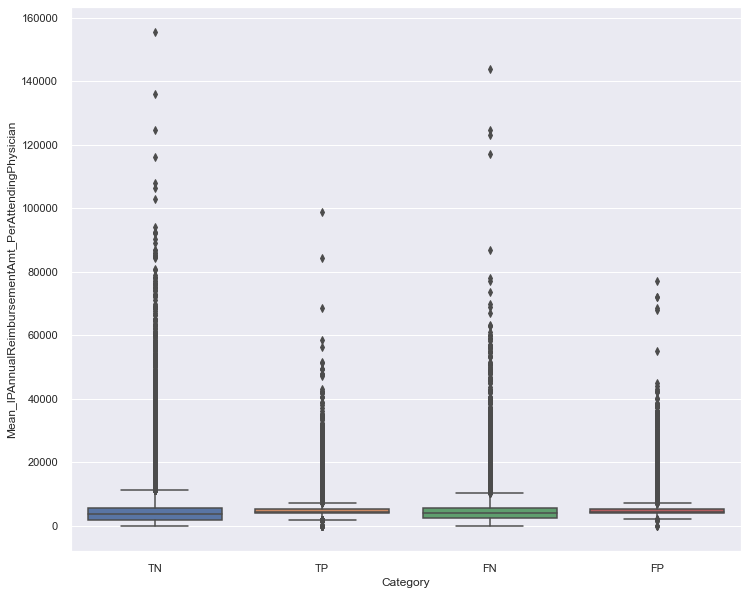

In [114]:
sns.set(rc={'figure.figsize':(12,10)})
sns.boxplot(x=df['Category'],y=df['Mean_IPAnnualReimbursementAmt_PerAttendingPhysician'],data=df)

Observation : From the above plot we observe that the interquartile range of the feature for True Negatives and False Negatives is more as compared to True Positives and False positives

<AxesSubplot:xlabel='Category', ylabel='Mean_IPAnnualReimbursementAmt_PerAttendingPhysician'>

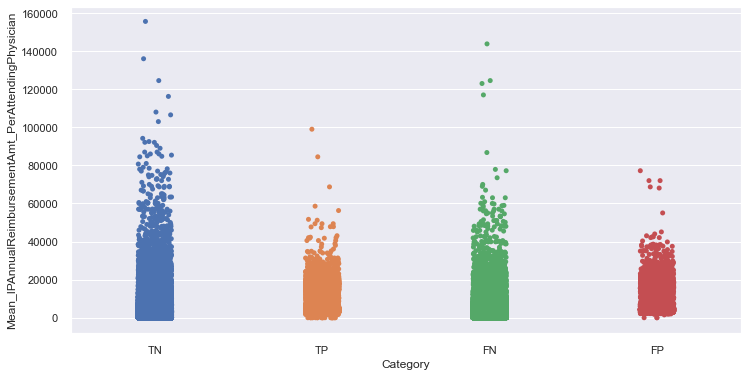

In [121]:
sns.set(rc={'figure.figsize':(12,6)})
sns.stripplot(x=df['Category'],y=df['Mean_IPAnnualReimbursementAmt_PerAttendingPhysician'])

Observation: True Negatives and False Negatives have higher values for this feature as compared to True Positives and False Positives

<AxesSubplot:xlabel='Category', ylabel='Mean_DeductibleAmtPaid_PerAttendingPhysician'>

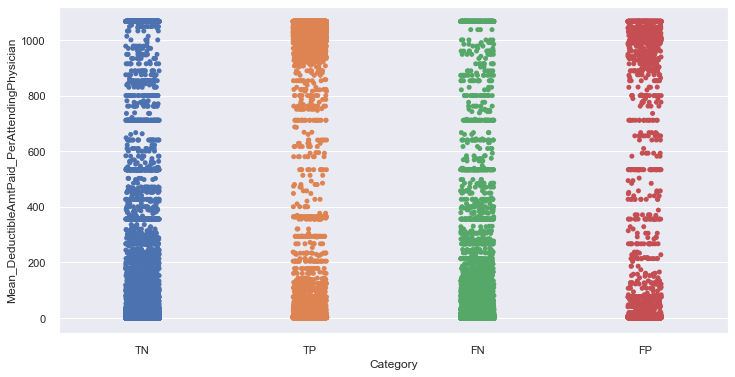

In [122]:
sns.set(rc={'figure.figsize':(12,6)})
sns.stripplot(x=df['Category'],y=df['Mean_DeductibleAmtPaid_PerAttendingPhysician'])

Observation: From these plots , we observe that points for which there are more values for Mean_DeductibleAmtPaid_PerAttendingPhysician , our model is predicting it as Fraud. But as we from the distribution of True Positive and False Negative , that originally , there is not much difference b/w the amount for both fraud and Non-fraud

<AxesSubplot:xlabel='Category', ylabel='Mean_OPAnnualDeductibleAmt_PerAttendingPhysician'>

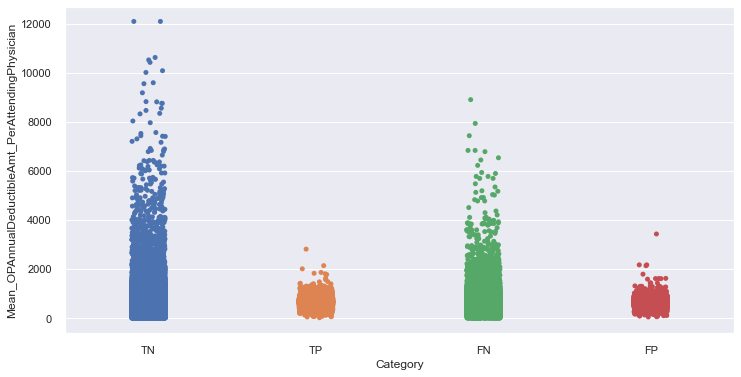

In [123]:
sns.set(rc={'figure.figsize':(12,6)})
sns.stripplot(x=df['Category'],y=df['Mean_OPAnnualDeductibleAmt_PerAttendingPhysician'])

Observation: The Fraud predicted claims have more density towards the lower values of Mean Outpatient Deductible amount paid per attending physician as compared to the Non-Fraud claims. This may be due to the reason that Physicians don't intentionally keep charge higher amounts for fraud claims so that it doesn't come to notics.

<AxesSubplot:xlabel='Category', ylabel='Mean_OPAnnualReimbursementAmt_PerAttendingPhysician'>

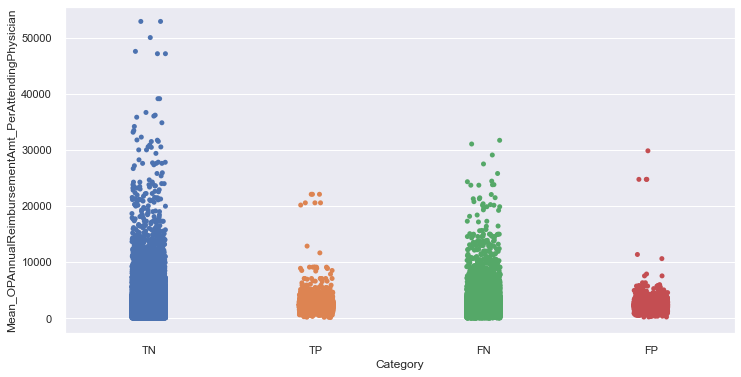

In [124]:
sns.set(rc={'figure.figsize':(12,6)})
sns.stripplot(x=df['Category'],y=df['Mean_OPAnnualReimbursementAmt_PerAttendingPhysician'])

Same behaviour is obersved as previous graph for this feature also.

<AxesSubplot:xlabel='Category', ylabel='Mean_DeductibleAmtPaid_PerOtherPhysician'>

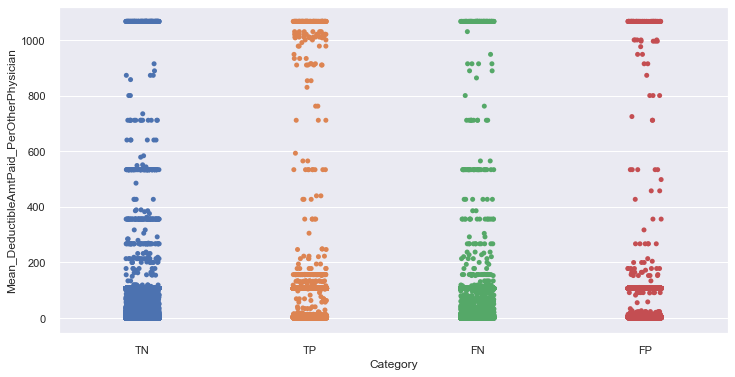

In [130]:
sns.set(rc={'figure.figsize':(12,6)})
sns.stripplot(x=df['Category'],y=df['Mean_DeductibleAmtPaid_PerOtherPhysician'])

<AxesSubplot:xlabel='Category', ylabel='Mean_OPAnnualReimbursementAmt_PerOperatingPhysician'>

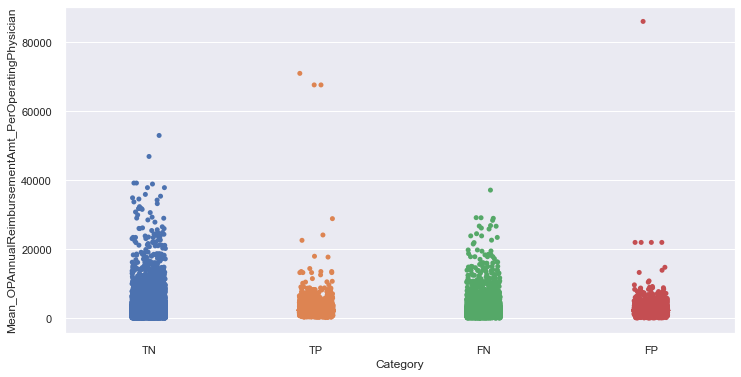

In [131]:
sns.set(rc={'figure.figsize':(12,6)})
sns.stripplot(x=df['Category'],y=df['Mean_OPAnnualReimbursementAmt_PerOperatingPhysician'])

In All the above graphs , we observe that True Positives & False Positives have similar kind of distribution all model is looking at the distribution of these features on points and predicting it to be Fraud. Similarly , the distribution of True Negatives and False Negatives is found to be similar. That means , based on some feature values , model is classifying points as Fraud. 

# Now we will compare all models again and use some ensembling techniques to improve model performance in Phase 4

In [34]:
compare_models(include=['lr','dt','rf','qda','ada','mlp','gbc','lightgbm'],cross_validation=False)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.7167,0.7318,0.4054,0.7317,0.5218,0.3432,0.3734,100.4600
lightgbm,Light Gradient Boosting Machine,0.7133,0.7172,0.4558,0.6867,0.5479,0.3503,0.3661,8.7400
gbc,Gradient Boosting Classifier,0.6879,0.6957,0.4398,0.6299,0.5179,0.2978,0.3083,914.5200
ada,Ada Boost Classifier,0.6807,0.6900,0.4910,0.5992,0.5397,0.2990,0.3025,210.8100
lr,Logistic Regression,0.6307,0.5544,0.1002,0.5921,0.1714,0.0686,0.1140,176.6300
mlp,MLP Classifier,0.6188,0.5001,0.0000,0.4000,0.0001,0.0000,0.0003,450.5100
dt,Decision Tree Classifier,0.6073,0.5761,0.4450,0.4836,0.4635,0.1547,0.1550,85.1500
qda,Quadratic Discriminant Analysis,0.4244,0.4956,0.7955,0.3786,0.5131,-0.0072,-0.0107,15.7900


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=100, verbose=0,
                       warm_start=False)